In [134]:
import numpy as np
import matplotlib.pylab as plt
import pandas as pd
import matplotlib as mpl
import scipy.stats as st
from scipy.stats import (vonmises_line, norm, t, cauchy, lognorm, fisk, skewnorm, exponweib, genlogistic, logistic, laplace)

import random

import glob
import os
from tqdm import tqdm

### Define colors an colormaps

In [135]:
# Color definitions
ClrS = (0.74, 0.00, 0.00)
ClrN = (0.20, 0.56, 1.00)

Clr = [(0.00, 0.00, 0.00),
      (0.31, 0.24, 0.00),
      (0.43, 0.16, 0.49),
      (0.32, 0.70, 0.30),
      (0.45, 0.70, 0.90),
      (1.00, 0.82, 0.67)]

### Read data, add date, Calibrate flux for MDI using 0.8 factor, and apply 3x10^21 Mx cuttoff

In [136]:
# Flux Cutoff in Maxwells
fCutoff = 3e21

KPVT = pd.read_csv('data/output/BARD_1976-1993_KPVT_tilts.csv')
KPVT = KPVT.loc[KPVT['BMRFlux']>=fCutoff,:]
KPVT['Date'] = pd.to_datetime(dict(year=KPVT.Year, month=KPVT.Month, day=KPVT.Day, hour=KPVT.Hour, minute=KPVT.Minute))
KPVT['Instrument'] = 'KPVT'

SPMG = pd.read_csv('data/output/BARD_1992-1999_SPMG_tilts.csv')
SPMG = SPMG.loc[SPMG['BMRFlux']>=fCutoff,:]
SPMG['Date'] = pd.to_datetime(dict(year=SPMG.Year, month=SPMG.Month, day=SPMG.Day, hour=SPMG.Hour, minute=SPMG.Minute))
SPMG['Instrument'] = 'SPMG'
SPMG['BMRLabel'] = SPMG['BMRLabel'] + np.max(KPVT['BMRLabel'])

MDIcalibration = 0.8
MDI = pd.read_csv('data/output/BARD_1996-2010_MDI_tilts.csv')
MDI.loc[:, ['PFlux', 'NFlux', 'BMRFlux']] *= MDIcalibration
MDI = MDI.loc[MDI['BMRFlux']>=fCutoff,:]
MDI['Date'] = pd.to_datetime(dict(year=MDI.Year, month=MDI.Month, day=MDI.Day, hour=MDI.Hour, minute=MDI.Minute))
MDI['Instrument'] = 'MDI'
MDI['BMRLabel'] = MDI['BMRLabel'] + np.max(SPMG['BMRLabel'])

HMI = pd.read_csv('data/output/BARD_2010-2016_HMI_tilts.csv')
HMI = HMI.loc[HMI['BMRFlux']>=fCutoff,:]
HMI['Date'] = pd.to_datetime(dict(year=HMI.Year, month=HMI.Month, day=HMI.Day, hour=HMI.Hour, minute=HMI.Minute))
HMI['Instrument'] = 'HMI'
HMI['BMRLabel'] = HMI['BMRLabel'] + np.max(MDI['BMRLabel'])


In [137]:
HMI

,ReferenceDay,Year,Month,Day,Hour,Minute,Second,BMRLabel,PFlux,PArea,...,HH_24n,AH_24n,HH_24s,AH_24s,Cycle24n,Cycle24s,Hale,AntiHale,Date,Instrument
1,486,2010,5,2,21,46,22.4,13425,5.720000e+21,2.400000e+19,...,True,False,False,False,True,False,True,False,2010-05-02 21:46:00,HMI
4,488,2010,5,4,21,46,22.6,13428,3.050000e+21,1.570000e+19,...,False,False,True,False,False,True,True,False,2010-05-04 21:46:00,HMI
5,490,2010,5,6,21,46,22.9,13429,4.240000e+21,1.410000e+19,...,True,False,False,False,True,False,True,False,2010-05-06 21:46:00,HMI
6,507,2010,5,23,21,46,24.7,13430,3.420000e+21,7.870000e+18,...,False,False,True,False,False,True,True,False,2010-05-23 21:46:00,HMI
7,512,2010,5,28,21,46,25.1,13431,2.150000e+21,8.790000e+18,...,True,False,False,False,True,False,True,False,2010-05-28 21:46:00,HMI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1448,2719,2016,6,12,21,46,46.7,16059,4.150000e+21,2.040000e+19,...,True,False,False,False,True,False,True,False,2016-06-12 21:46:00,HMI
1451,2724,2016,6,17,21,46,46.9,16063,3.950000e+21,1.390000e+19,...,False,False,True,False,False,True,True,False,2016-06-17 21:46:00,HMI
1453,2725,2016,6,18,21,46,47.0,16066,2.080000e+21,1.060000e+19,...,True,False,False,False,True,False,True,False,2016-06-18 21:46:00,HMI
1454,2727,2016,6,20,21,46,47.0,16068,1.150000e+22,2.030000e+19,...,False,False,True,False,False,True,True,False,2016-06-20 21:46:00,HMI


### Remove overlaps between missions

In [138]:
KPVT = KPVT.loc[KPVT['Date']<np.min(SPMG['Date']),:]
SPMG = SPMG.loc[SPMG['Date']<np.min(MDI['Date']),:]
MDI = MDI.loc[MDI['Date']<np.min(HMI['Date']),:]

### Concatenate all instruments

In [139]:
allMag = pd.concat([KPVT, SPMG, MDI, HMI], ignore_index=True).drop(labels=['ReferenceDay', 'Flux_cut'], axis=1).replace(np.nan, False)
allMag.to_csv('data/output/BARD_1976-2016_Merge_tilts.csv', index=False)

allMag['pltSize'] = (np.sqrt(allMag['BMRFlux']/1e21))
allMag

,Year,Month,Day,Hour,Minute,Second,BMRLabel,PFlux,PArea,PLatitude,...,AH_23s,Cycle23n,Cycle23s,HH_24n,AH_24n,HH_24s,AH_24s,Cycle24n,Cycle24s,pltSize
0,1976,1,13,17,26,59.0,1,6.690000e+21,1.590000e+19,-9.9094,...,False,False,False,False,False,False,False,False,False,4.614109
1,1976,2,15,18,19,8.0,3,2.370000e+21,1.170000e+19,-11.1080,...,False,False,False,False,False,False,False,False,False,1.939072
2,1976,2,20,18,43,18.0,4,2.490000e+21,1.440000e+19,-2.6919,...,False,False,False,False,False,False,False,False,False,2.209072
3,1976,3,13,21,24,36.0,8,3.080000e+21,1.270000e+19,-33.7100,...,False,False,False,False,False,False,False,False,False,2.424871
4,1976,8,12,21,14,0.0,13,1.790000e+21,9.400000e+18,23.7860,...,False,False,False,False,False,False,False,False,False,1.769181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7565,2016,6,12,21,46,46.7,16059,4.150000e+21,2.040000e+19,4.1443,...,False,False,False,True,False,False,False,True,False,2.716616
7566,2016,6,17,21,46,46.9,16063,3.950000e+21,1.390000e+19,-8.5136,...,False,False,False,False,False,True,False,False,True,2.505993
7567,2016,6,18,21,46,47.0,16066,2.080000e+21,1.060000e+19,6.2451,...,False,False,False,True,False,False,False,True,False,2.017424
7568,2016,6,20,21,46,47.0,16068,1.150000e+22,2.030000e+19,-6.1588,...,False,False,False,False,False,True,False,False,True,3.506565


In [140]:
for k in allMag.BMRLabel:
    df_k = pd.DataFrame((allMag.BMRLabel==k))*1
    
allMag[allMag.BMRLabel==247].index[1]
#allMag.drop(135,axis=0)

136

In [141]:
for k in allMag.BMRLabel:
    df_k = (allMag.BMRLabel==k)*1
    suma = df_k.sum()#[0]
    if suma > 1:
        index_1 = allMag[allMag.BMRLabel==k].index[1]
        allMag = allMag.drop(index_1, axis=0)

In [142]:
df = pd.DataFrame(allMag.BMRLabel)
counter = 0
for k in allMag.BMRLabel:
    df_k = (allMag.BMRLabel==k)*1
    suma = df_k.sum()#[0]
    if suma > 1:
        counter +=1
        print('Problema en BMRLabel ', k)

In [143]:
allMag = allMag.reset_index()

### Plot data

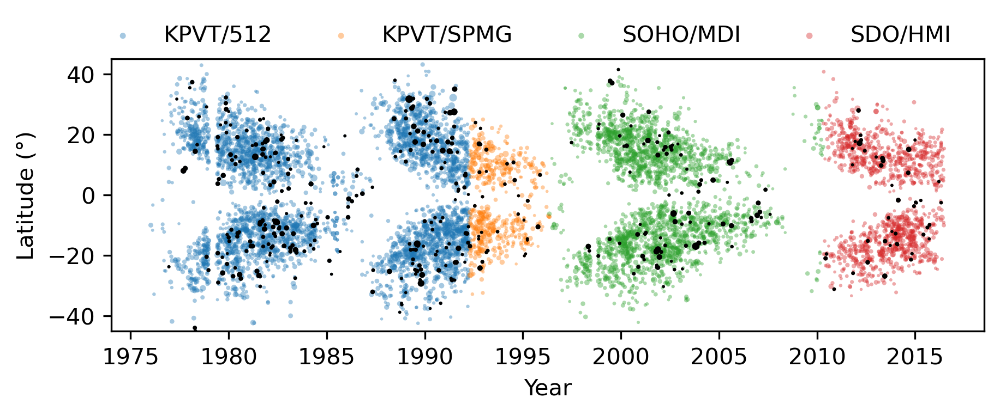

In [144]:
# Size definitions
dpi = 300
pxx = 1600  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)

ax1 = fig.add_axes([ppadh, ppadv, ppxx, ppxy])

size = (np.sqrt(KPVT['BMRFlux']/1e21))
ax1.scatter(KPVT['Date'], KPVT['BMRLatitude'], s=size, alpha=0.4, ec='None', label='KPVT/512')


size = (np.sqrt(SPMG['BMRFlux']/1e21))
ax1.scatter(SPMG['Date'], SPMG['BMRLatitude'], s=size, alpha=0.4, ec='None', label='KPVT/SPMG')


size = (np.sqrt(MDI['BMRFlux']/1e21))
ax1.scatter(MDI['Date'], MDI['BMRLatitude'], s=size, alpha=0.4, ec='None', label='SOHO/MDI')


size = (np.sqrt(HMI['BMRFlux']/1e21))
ax1.scatter(HMI['Date'], HMI['BMRLatitude'], s=size, alpha=0.4, ec='None', label='SDO/HMI')


size = (np.sqrt(allMag['BMRFlux']/1e21))
mask = allMag['AntiHale']
ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=1,fc='k', ec='None')


ax1.set_ylim([-45, 45])
ax1.set_ylabel('Latitude (°)')
ax1.set_xlabel('Year')
ax1.legend(frameon=False, ncol=4, loc='upper center', bbox_to_anchor=(0.475, 1.2))



# Tilt Distributions for different cycles

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

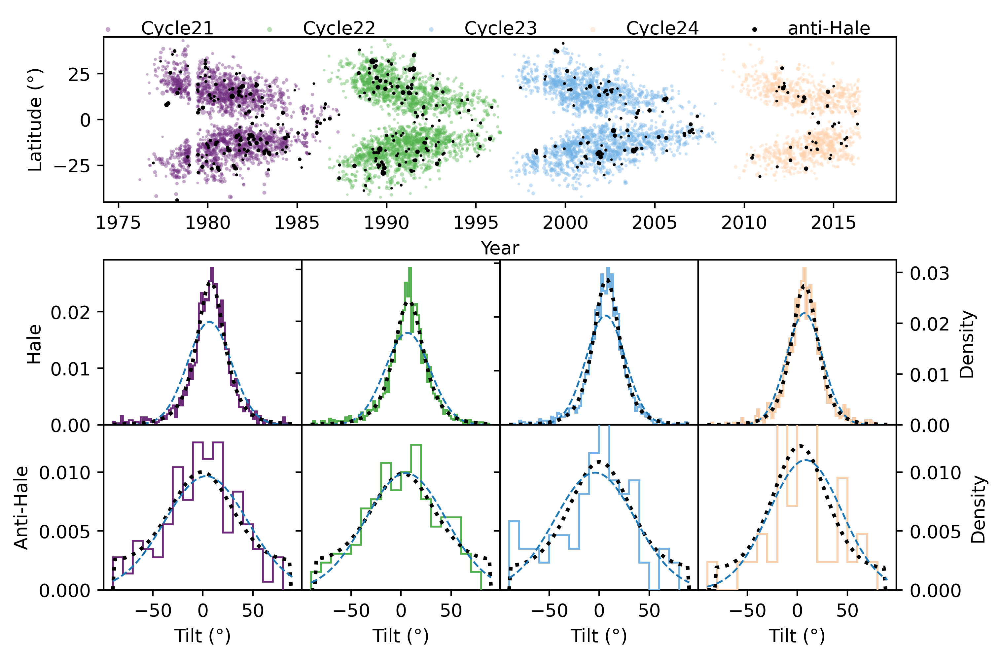

In [145]:
tbins = np.arange(-90, 90, 2)
x = np.linspace(-90, 90, 100)

# Size definitions
dpi = 400
pxx = 600  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)

ax1 = fig.add_axes([ppadh, ppadv, 4*ppxx, ppxy])

size = (np.sqrt(allMag['BMRFlux']/1e21))
for cyc in np.arange(21,25):

    mask = np.logical_or(allMag[f'Cycle{str(cyc)}n'],allMag[f'Cycle{str(cyc)}s'])
    ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=0.4, ec='None', label=f'Cycle{str(cyc)}', c=Clr[cyc-19])

    tbins = np.arange(-90, 90, 2)
    ax2 = fig.add_axes([ppadh + (cyc-21)*ppxx, ppadv-ppxy*1.35, ppxx, ppxy])
    mask = np.logical_and(mask, allMag[f'Hale'])
    tilt = np.concatenate((-allMag.loc[np.logical_and(mask, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask, allMag['BMRLatitude']<0),'Tilt_rel']))
    ax2.hist(tilt, bins = tbins, density=True, histtype='step', lw=1, label='Hale', color=Clr[cyc-19], zorder=3)

    ax2.plot(x, st.norm.pdf(x, *norm.fit(tilt)), color='C0', ls='--', lw=1, label='normal', zorder=3)
    ax2.plot(x, st.t.pdf(x, *t.fit(tilt)), color='k', ls=':', lw=2, label='Student\'s-t', zorder=3)    


    for cyc2 in np.arange(21,25):

        if cyc2 != cyc:

            mask2 = np.logical_or(allMag[f'Cycle{str(cyc2)}n'],allMag[f'Cycle{str(cyc2)}s'])
            mask2 = np.logical_and(mask, allMag[f'Hale'])
            tilt = np.concatenate((-allMag.loc[np.logical_and(mask2, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask2, allMag['BMRLatitude']<0),'Tilt_rel']))
            ax2.hist(tilt, bins = tbins, density=True, histtype='step', lw=1, label='Hale', color=Clr[cyc2-19], alpha=0.4, zorder=1)


    ax2.set_xlabel('Tilt (°)')

    if cyc>21 and cyc<24:
        ax2.set_yticklabels([])

    if cyc==24:
        ax2.yaxis.set_label_position('right')
        ax2.yaxis.tick_right()
        ax2.set_ylabel('Density')

    if cyc==21:
        ax2.set_ylabel('Hale')



    mask = np.logical_or(allMag[f'Cycle{str(cyc)}n'],allMag[f'Cycle{str(cyc)}s'])

    tbins = np.arange(-90, 90, 10)
    ax2 = fig.add_axes([ppadh + (cyc-21)*ppxx, ppadv-ppxy*2.35, ppxx, ppxy])
    mask = np.logical_and(mask, allMag[f'AntiHale'])
    tilt = np.concatenate((-allMag.loc[np.logical_and(mask, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask, allMag['BMRLatitude']<0),'Tilt_rel']))
    ax2.hist(tilt, bins = tbins, density=True, histtype='step', lw=1, label='Hale', color=Clr[cyc-19], zorder=3)




    ax2.plot(x, st.vonmises_line.pdf(x*np.pi/180, *vonmises_line.fit(tilt*np.pi/180))*np.pi/180, color='k', ls=':', lw=2, label='normal', zorder=3)
    ax2.plot(x, st.norm.pdf(x, *norm.fit(tilt)), color='C0', ls='--', lw=1, label='normal', zorder=3)

    for cyc2 in np.arange(21,25):

        if cyc2 != cyc:

            mask2 = np.logical_or(allMag[f'Cycle{str(cyc2)}n'],allMag[f'Cycle{str(cyc2)}s'])
            mask2 = np.logical_and(mask, allMag[f'AntiHale'])
            tilt = np.concatenate((-allMag.loc[np.logical_and(mask2, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask2, allMag['BMRLatitude']<0),'Tilt_rel']))
            ax2.hist(tilt, bins = tbins, density=True, histtype='step', lw=1, label='Hale', color=Clr[cyc2-19], alpha=0.4, zorder=1)


    ax2.set_xlabel('Tilt (°)')
    ax2.set_ylim([0, 0.014])

    if cyc>21 and cyc<24:
        ax2.set_yticklabels([])

    if cyc==24:
        ax2.yaxis.set_label_position('right')
        ax2.yaxis.tick_right()
        ax2.set_ylabel('Density')

    if cyc==21:
        ax2.set_ylabel('Anti-Hale')        
    


mask = allMag['AntiHale']
ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=1,fc='k', ec='None', label='anti-Hale')


ax1.set_ylim([-45, 45])
ax1.set_ylabel('Latitude (°)')
ax1.set_xlabel('Year')
ax1.legend(frameon=False, ncol=5, loc='upper center', bbox_to_anchor=(0.475, 1.2))

### Akaike Information Criterion on different cycles

In [146]:


# AKAIKE
def aic(data, dist, distname):
    if distname=='vonmises_l':
        log_likelihood = dist.logpdf(data, *dist.fit(data))
    else:
        log_likelihood = dist.logpdf(data, *dist.fit(data))
    aic_score =  2 * len(dist.fit(data)) - 2 * np.sum(log_likelihood)
    return aic_score

def aic_analysis(data):
#     dist = np.array([norm, cauchy, t, lognorm, fisk, skewnorm, exponweib])
#     dist1 = ['norm', 'cauchy', 't-student', 'lognorm', 'loglogistic', 'skewnorm', 'exponweib']
    dist = np.array([t, laplace, logistic, vonmises_line, skewnorm, norm, cauchy])
    dist1 = ['t-student', 'laplace', 'logistic', 'vonmises_l', 'skewnorm', 'norm','cauchy']

    akaike = np.zeros(len(dist))
    for k in range(len(dist)):
        akaike[k] = aic(data, dist[k], dist1[k])
        
    
    KS = np.zeros(len(dist))
    p = np.zeros(len(dist))
    for k in range(len(dist)):
        if dist1[k]=='vonmises_l':
            print(dist1[k], dist[k].fit(data))
        else:
            print(dist1[k], dist[k].fit(data))
        KS[k], p[k] = st.ks_1samp(data, dist[k](*dist[k].fit(data)).cdf)

    RL = np.exp((min(akaike) - akaike)/2)
    AICw = np.round(RL/np.sum(RL),2)
    df = pd.DataFrame({'dist': dist1, 'ΔAIC': np.round(akaike - min(akaike),2), 'RelativeLikelihood': np.round(RL,2), 'AICw': AICw, 'KS': np.round(KS,3), 'p': np.round(p,2)})
    return df

def lat_aic(data, lat_data, maxim=4, interval=10):
    # Asumption that data already has been corrected to combine
    
    df = pd.DataFrame(aic_analysis(data)['dist'])
    for i in np.arange(0, maxim, 1):
        name = 'RL ' + str(i*interval) + '-' + str((i+1)*interval)
        df[name] = aic_analysis(data[np.logical_and(lat_data > i*interval,
                                                    lat_data < (i+1)*interval)])['AICw']
        
    return df

### Hale

In [147]:
for cyc in np.arange(21,25):
    mask = np.logical_or(allMag[f'Cycle{str(cyc)}n'],allMag[f'Cycle{str(cyc)}s'])
    mask = np.logical_and(mask, allMag[f'Hale'])
    tilt = np.concatenate((-allMag.loc[np.logical_and(mask, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask, allMag['BMRLatitude']<0),'Tilt_rel']))
    print(f'Cycle {cyc} ------------------------------')
    df = aic_analysis(tilt)
    print(df)

Cycle 21 ------------------------------
t-student (3.2077381697748133, 7.851735836777384, 14.606395911082725)
laplace (7.96499615262943, 15.501142216106597)
logistic (7.4848153214281465, 11.296832915521867)
vonmises_l (2.874638955372045, 7.216495559054838, 30.840403557480094)
skewnorm (-1.5175842108838997, 25.728991237202756, 29.09560511114986)
norm (6.606866807844698, 21.904145690498304)
cauchy (8.1109124004522, 10.298948981933492)
         dist    ΔAIC  RelativeLikelihood  AICw     KS     p
0   t-student    0.00                1.00  0.99  0.016  0.68
1     laplace    9.51                0.01  0.01  0.025  0.19
2    logistic   63.70                0.00  0.00  0.035  0.02
3  vonmises_l   74.54                0.00  0.00  0.050  0.00
4    skewnorm  208.51                0.00  0.00  0.072  0.00
5        norm  282.56                0.00  0.00  0.084  0.00
6      cauchy  319.22                0.00  0.00  0.057  0.00
Cycle 22 ------------------------------
t-student (3.3697491907334847, 7.68

### Anti-Hale

In [148]:
for cyc in np.arange(21,25):
    mask = np.logical_or(allMag[f'Cycle{str(cyc)}n'],allMag[f'Cycle{str(cyc)}s'])
    mask = np.logical_and(mask, allMag[f'AntiHale'])
    tilt = np.concatenate((-allMag.loc[np.logical_and(mask, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask, allMag['BMRLatitude']<0),'Tilt_rel']))
    print(f'Cycle {cyc} ------------------------------')
    df = aic_analysis(tilt)
    print(df)

Cycle 21 ------------------------------
t-student (5314450.453121252, 3.2947468021271824, 41.33982173307578)
laplace (2.250248789610824, 32.85200236198563)
logistic (2.924476303917519, 23.71853745747896)
vonmises_l (0.6779591048350753, -1.3404805227517063, 28.043970205674512)
skewnorm (0.5802750517343367, -14.775838165642336, 45.11694602247054)
norm (3.2943961338421093, 41.340121373546324)
cauchy (1.967773623661208, 24.415518694588044)
         dist   ΔAIC  RelativeLikelihood  AICw     KS     p
0   t-student  23.07                 0.0   0.0  0.052  0.78
1     laplace  34.74                 0.0   0.0  0.061  0.59
2    logistic  25.36                 0.0   0.0  0.038  0.97
3  vonmises_l   0.00                 1.0   1.0  0.063  0.55
4    skewnorm  23.04                 0.0   0.0  0.050  0.82
5        norm  21.07                 0.0   0.0  0.052  0.78
6      cauchy  75.15                 0.0   0.0  0.089  0.16
Cycle 22 ------------------------------
t-student (10863611.353631422, 4.7508443

# Tilt averages and standard deviations

# BMRs

In [149]:
# allMag

BMR_R = (allMag['PpixelAvgRadius'] + allMag['NpixelAvgRadius'])/2

DBMr = 3/(4*np.pi)*allMag['BMRFlux']/(allMag['BMRArea']*1e4)*BMR_R*np.pi/180

DBMr_HH = DBMr[allMag.Hale]*2*np.cos(allMag[allMag.Hale].BMRLatitude*np.pi/180)*( np.sin(allMag[allMag.Hale].PLatitude*np.pi/180) - np.sin(allMag[allMag.Hale].NLatitude*np.pi/180) )

DBMr_AH = -DBMr[allMag.AntiHale]*2*np.cos(allMag[allMag.AntiHale].BMRLatitude*np.pi/180)*( np.sin(allMag[allMag.AntiHale].NLatitude*np.pi/180) - np.sin(allMag[allMag.AntiHale].PLatitude*np.pi/180) )

In [150]:
allMag['BMRColatitude'] = (90 - allMag.BMRLatitude) * np.pi/180
allMag['PColatitude'] = (90 - allMag.PLatitude) * np.pi/180
allMag['NColatitude'] = (90 - allMag.NLatitude) * np.pi/180

R_sun = 6.96 * 10e8 * 10e2  # cm

D_bmr = - (3/(4*np.pi)) * allMag.BMRFlux * np.sin(allMag.BMRColatitude) * (allMag.PColatitude - allMag.NColatitude) / R_sun**2

D_bmr_HH = D_bmr[allMag.Hale]
D_bmr_AH = D_bmr[allMag.AntiHale]

In [151]:
DBMrs = pd.concat([DBMr_HH, DBMr_AH])
DBMrs = pd.DataFrame(DBMrs)
allMag['DBMr'] = D_bmr

# Active longitudes

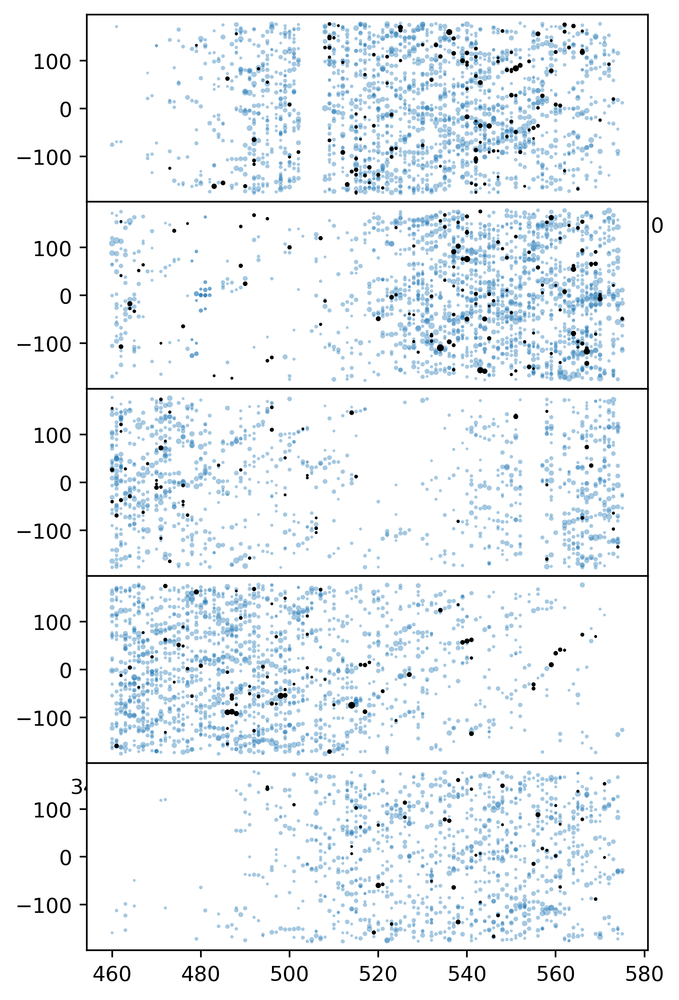

In [152]:
duration = pd.Timedelta(8*365, "d") # In years
t1 = np.min(allMag['Date'])
t2 = np.max(allMag['Date'])

rotation_rate = 25.38 # in days

allMag['Rot_time'] = np.floor((allMag['Date']-np.min(allMag['Date'])).dt.days//rotation_rate)

# allMag['BMRLongitude'] -= 360*allMag['BMRLongitude']//360

ncycles = np.round((t2-t1)/duration)


# Size definitions
dpi = 400
pxx = 1500  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)



size = (np.sqrt(allMag['BMRFlux']/1e21))
for n in np.arange(0,ncycles):
    
    ax1 = fig.add_axes([ppadh, ppadv-n*ppxy, ppxx, ppxy])

    # mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
    # ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=0.4, ec='None')

    # mask = np.logical_and(mask, allMag['AntiHale'])
    # ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,fc='k', ec='None')


    mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
    ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=0.4, ec='None')

    mask = np.logical_and(mask, allMag['AntiHale'])
    ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,fc='k', ec='None')    

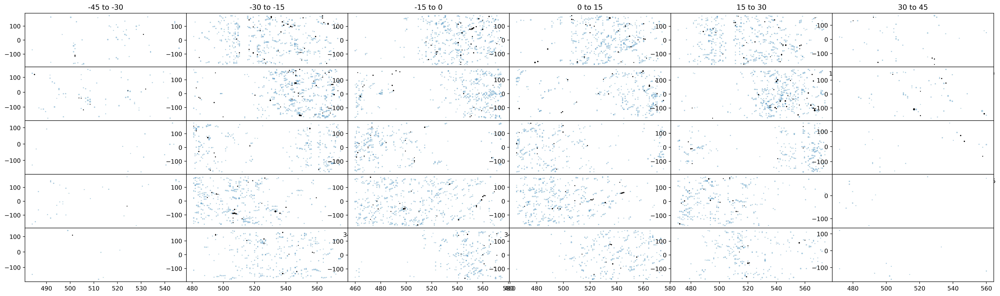

In [153]:
duration = pd.Timedelta(8*365, "d") # In years
t1 = np.min(allMag['Date'])
t2 = np.max(allMag['Date'])

rotation_rate = 25.38 # in days

allMag['Rot_time'] = np.floor((allMag['Date']-np.min(allMag['Date'])).dt.days//rotation_rate)

# allMag['BMRLongitude'] -= 360*allMag['BMRLongitude']//360

ncycles = np.round((t2-t1)/duration)


# Size definitions
dpi = 400
pxx = 1500  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)



size = (np.sqrt(allMag['BMRFlux']/1e21))

for i in np.arange(0,6):

    l1 = -45+i*15
    l2 = -45+(i+1)*15

    for n in np.arange(0,ncycles):
        
        ax1 = fig.add_axes([ppadh+i*ppxx, ppadv-n*ppxy, ppxx, ppxy])

        mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
        mask = np.logical_and(mask, allMag['BMRLatitude']>=l1)
        mask = np.logical_and(mask, allMag['BMRLatitude']<l2)
        ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=0.4, ec='None')

        mask = np.logical_and(mask, allMag['AntiHale'])
        ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,fc='k', ec='None')

        if n==0:
            ax1.set_title(f'{l1} to {l2}')

     

In [154]:
# reference day
# time_0 = '1970-01-01 00:00:00'

time_0 = pd.to_datetime(0)
ref_day = (allMag['Date'] - time_0)

for i in range(len(ref_day)):
    ref_day[i] = ref_day[i].days

allMag['ReferenceDay'] = ref_day
ref_day

0        2203
1        2236
2        2241
3        2263
4        2415
        ...  
7538    16964
7539    16969
7540    16970
7541    16972
7542    16981
Name: Date, Length: 7543, dtype: object

In [155]:
ref_day

0        2203
1        2236
2        2241
3        2263
4        2415
        ...  
7538    16964
7539    16969
7540    16970
7541    16972
7542    16981
Name: Date, Length: 7543, dtype: object

In [156]:
# diferential rotation

def dif_rotation(lat):
    A = 14.713              # degrees/days
    B = -2.396              # degrees/days
    C = -1.787              # degrees/days
    c_r = 360 / 25.38       # degrees/days

    return(A - c_r + B * np.sin(np.pi * lat / 180)**2 + C * np.sin(np.pi * lat / 180)**4)

In [157]:
# identifier

def identifier(all_mag, region, lat_tol, lon_tol, d_before, d_after):

    d_before = pd.Timedelta(d_before, 'd')
    d_after = pd.Timedelta(d_after, 'd')

    temporal = pd.DataFrame()
    lon = region['BMRLongitude']
    lat = region['BMRLatitude']
    ref_day = region['Date']

    rotation = dif_rotation(lat)
    
    bmr_latitude = all_mag['BMRLatitude']
    bmr_longitude = all_mag['BMRLongitude']

    rotation_diff = dif_rotation(bmr_latitude) - rotation
    corrected_longitude = rotation_diff * (all_mag['Date'] - ref_day).dt.days + bmr_longitude

    corrected_longitude[corrected_longitude > 180] = corrected_longitude[corrected_longitude > 180] - 360
    corrected_longitude[corrected_longitude < -180] = corrected_longitude[corrected_longitude < -180] + 360

    # longitude correction

    all_mag['CorrectedLongitude'] = corrected_longitude

    # lat lim

    lat_up = lat > 180 - lat_tol
    lat_down = lat < lat_tol - 180

    if lat_up:
        lat_range = np.logical_or(all_mag['BMRLatitude'] < lat + lat_tol - 360, lat - lat_tol < all_mag['BMRLatitude'])
    elif lat_down:
        lat_range = np.logical_or(all_mag['BMRLatitude'] < lat + lat_tol, 180 - lat_tol + np.abs(-180 - lat) < all_mag['BMRLatitude'])
    else:
        lat_range = np.logical_and(all_mag['BMRLatitude'] < lat + lat_tol, lat - lat_tol < all_mag['BMRLatitude'])

    # lon lim

    lon_up = lon > 180 - lon_tol
    lon_down = lon < lon_tol - 180

    if lon_up:
        lon_range = np.logical_or(all_mag['CorrectedLongitude'] < lon + lon_tol - 360, lon - lon_tol < all_mag['CorrectedLongitude'])
    elif lon_down:
        lon_range = np.logical_or(all_mag['CorrectedLongitude'] < lon + lon_tol, 180 - lon_tol + np.abs(-180 - lon) < all_mag['CorrectedLongitude'])
    else:
        lon_range = np.logical_and(all_mag['CorrectedLongitude'] < lon + lon_tol, lon - lon_tol < all_mag['CorrectedLongitude'])

    latlon_range = np.logical_and(lat_range, lon_range)
    t_range = np.logical_and(all_mag['Date'] < ref_day + d_after, ref_day - d_before < all_mag['Date'])
    mask = np.logical_and(latlon_range, t_range)
    #mask = np.logical_and(mask, all_mag['BMRLabel'] != region['BMRLabel'])
    all_mag_mask = all_mag[mask]

    temporal = temporal.append(all_mag_mask, ignore_index = True)

    # ids
    ids_np = region['BMRLabel'] * np.ones(len(all_mag_mask))
    ids = pd.DataFrame(ids_np)
    temporal['BMRid'] = ids

    # time
    time_np = region['ReferenceDay'] * np.ones(len(all_mag_mask))
    times = pd.DataFrame(time_np)[0]
    delta_time = temporal['ReferenceDay'] - times
    temporal['delta_time'] = delta_time

    # latitude
    lat_np = region['BMRLatitude'] * np.ones(len(all_mag_mask))
    latitudes = pd.DataFrame(lat_np)[0]
    delta_lat = temporal['BMRLatitude'] - latitudes
    temporal['delta_lat'] = delta_lat

    # longitude
    lon_np = region['BMRLongitude'] * np.ones(len(all_mag_mask))
    longitudes = pd.DataFrame(lon_np)[0]
    delta_lon = temporal['CorrectedLongitude'] - longitudes
    delta_lon[delta_lon > 180] = 360 - delta_lon[delta_lon > 180]
    delta_lon[delta_lon < -180] = -360 - delta_lon[delta_lon < -180]
    temporal['delta_lon'] = delta_lon


    return(temporal)

In [158]:
allMag.columns

Index(['index', 'Year', 'Month', 'Day', 'Hour', 'Minute', 'Second', 'BMRLabel',
       'PFlux', 'PArea', 'PLatitude', 'PLongitude', 'PpixelAvgRadius', 'NFlux',
       'NArea', 'NLatitude', 'NLongitude', 'NpixelAvgRadius', 'R',
       'LeadingPolarity', 'DayAfterChrist', 'FRACYEAR', 'PlotSize',
       'BMRLatitude', 'BMRLongitude', 'BMRArea', 'BMRFlux', 'Tilt_rel',
       'Tilt_abs', 'HH_21n', 'AH_21n', 'HH_21s', 'AH_21s', 'HH_22n', 'AH_22n',
       'HH_22s', 'AH_22s', 'Cycle21n', 'Cycle21s', 'Cycle22n', 'Cycle22s',
       'Hale', 'AntiHale', 'Date', 'Instrument', 'HH_23n', 'AH_23n', 'HH_23s',
       'AH_23s', 'Cycle23n', 'Cycle23s', 'HH_24n', 'AH_24n', 'HH_24s',
       'AH_24s', 'Cycle24n', 'Cycle24s', 'pltSize', 'BMRColatitude',
       'PColatitude', 'NColatitude', 'DBMr', 'Rot_time', 'ReferenceDay'],
      dtype='object')

In [159]:
# lon_tol : 20
# lat_tol : 20
# d_tol   : 90

dic_90_ah = {}
dic_90_hh = {}

for k in range(len(allMag)):
    region = allMag.iloc[k,0:]
    mini_tabla = identifier(allMag, region, 20, 20, 90, 0)    # allMag, region, lat_tol, lon_tol, d_before, d_after

    if mini_tabla.shape[0]>0:

        if region.AntiHale == 1:
            dic_90_ah[region.BMRLabel] = mini_tabla
        else:
            dic_90_hh[region.BMRLabel] = mini_tabla

In [160]:
def analyzed_range_ah(start_year, end_year, lat_min, lat_max, lon_min, lon_max):
    mask = np.logical_and(allMag.Year > start_year, allMag.Year < end_year)
    mask = np.logical_and(mask, allMag['BMRLatitude']>= lat_min)
    mask = np.logical_and(mask, allMag['BMRLatitude']<lat_max)
    new_data = allMag[mask]

    fig = plt.figure(figsize=(15,5))

    ax = fig.add_axes([0.1, 0.1, 1, 1])
    ax.scatter(new_data.loc[new_data['Hale'],'Date'], new_data.loc[new_data['Hale'],'BMRLongitude'], alpha=0.5)

    for label, bmr in dic_90_ah.items():
            mask = np.logical_and(bmr.Year > start_year, bmr.Year < end_year)
            mask = np.logical_and(mask, bmr['BMRLatitude']>=lat_min)
            mask = np.logical_and(mask, bmr['BMRLatitude']<lat_max)
            if np.sum(mask>0):
                #if bool_value(mask):
                    color = ["#"+''.join([random.choice('ABCDEF0123456789') for i in range(6)])][0]         
                    ax.scatter(bmr.loc[mask,'Date'], bmr.loc[mask,'BMRLongitude'], alpha=1, ec='None', fc=color)

    ax.scatter(new_data.loc[new_data['AntiHale'],'Date'], new_data.loc[new_data['AntiHale'],'BMRLongitude'], ec='k', fc='None')#, s=size[mask])

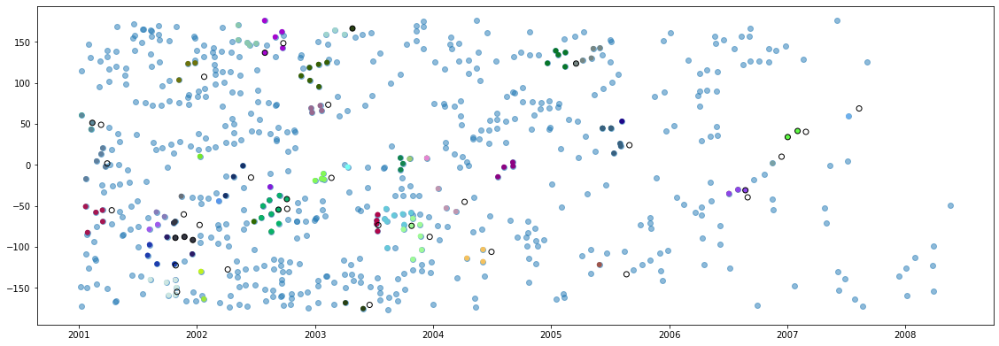

In [161]:
analyzed_range_ah(2000, 2010, -25, 0,0,0)

In [162]:
def analyzed_range_hh(start_year, end_year, lat_min, lat_max, lon_min, lon_max):
    mask = np.logical_and(allMag.Year > start_year, allMag.Year < end_year)
    mask = np.logical_and(mask, allMag['BMRLatitude']>= lat_min)
    mask = np.logical_and(mask, allMag['BMRLatitude']<lat_max)
    new_data = allMag[mask]

    fig = plt.figure(figsize=(15,5))

    ax = fig.add_axes([0.1, 0.1, 1, 1])
    ax.scatter(new_data.loc[new_data['AntiHale'],'Date'], new_data.loc[new_data['AntiHale'],'BMRLongitude'], alpha=0.5)

    for label, bmr in dic_90_hh.items():
            mask = np.logical_and(bmr.Year > start_year, bmr.Year < end_year)
            mask = np.logical_and(mask, bmr['BMRLatitude']>=lat_min)
            mask = np.logical_and(mask, bmr['BMRLatitude']<lat_max)
            if np.sum(mask>0):
                #if bool_value(mask):
                    color = ["#"+''.join([random.choice('ABCDEF0123456789') for i in range(6)])][0]         
                    ax.scatter(bmr.loc[mask,'Date'], bmr.loc[mask,'BMRLongitude'], alpha=1, ec='None', fc=color)

    ax.scatter(new_data.loc[new_data['Hale'],'Date'], new_data.loc[new_data['Hale'],'BMRLongitude'], ec='k', fc='None')#, s=size[mask])

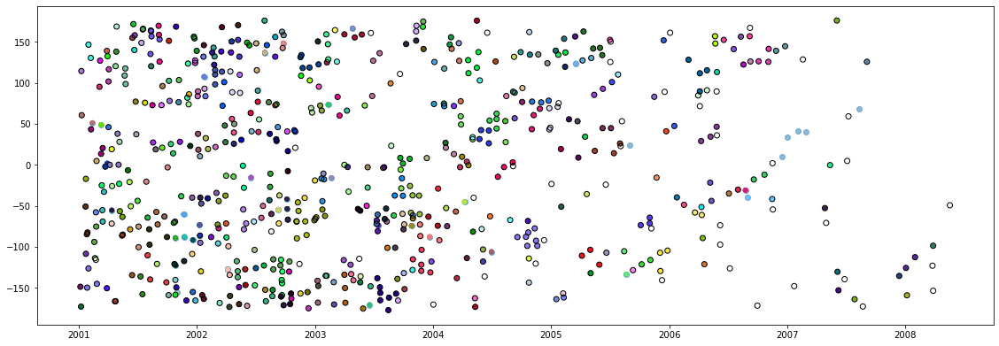

In [163]:
analyzed_range_hh(2000, 2010, -25, 0,0,0)

In [164]:
def analyzed_region_ah(start_year, end_year, lat_min, lat_max, bmr_label):
    mask = np.logical_and(allMag.Year > start_year, allMag.Year < end_year)
    mask = np.logical_and(mask, allMag['BMRLatitude']>= lat_min)
    mask = np.logical_and(mask, allMag['BMRLatitude']<lat_max)
    new_data = allMag[mask]

    fig = plt.figure(figsize=(15,5))

    ax = fig.add_axes([0.1, 0.1, 1, 1])
    ax.scatter(new_data.loc[new_data['Hale'],'Date'], new_data.loc[new_data['Hale'],'BMRLongitude'], alpha=0.5)
    
    ax.scatter(dic_90_ah[bmr_label].Date, dic_90_ah[bmr_label].BMRLongitude)

    ax.scatter(new_data.loc[new_data['AntiHale'],'Date'], new_data.loc[new_data['AntiHale'],'BMRLongitude'], ec='k', fc='None')#, s=size[mask])

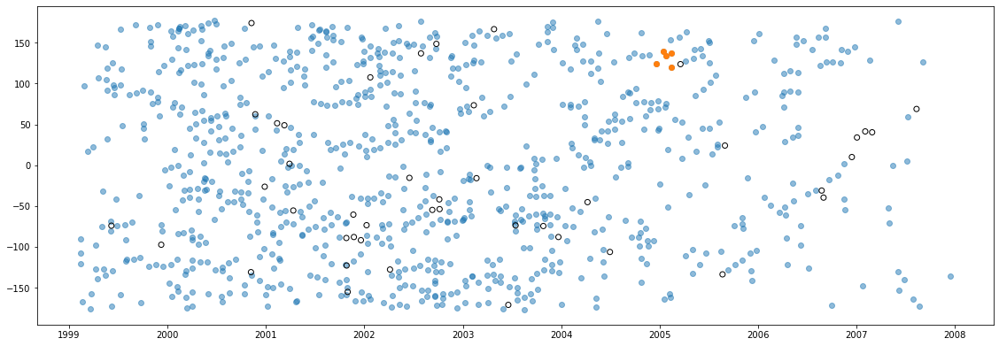

In [165]:
analyzed_region_ah(1998,2008,-25,0,13009)

In [166]:
def analyzed_region_hh(start_year, end_year, lat_min, lat_max, bmr_label):
    mask = np.logical_and(allMag.Year > start_year, allMag.Year < end_year)
    mask = np.logical_and(mask, allMag['BMRLatitude']>= lat_min)
    mask = np.logical_and(mask, allMag['BMRLatitude']<lat_max)
    new_data = allMag[mask]

    fig = plt.figure(figsize=(15,5))

    ax = fig.add_axes([0.1, 0.1, 1, 1])
    ax.scatter(new_data.loc[new_data['AntiHale'],'Date'], new_data.loc[new_data['AntiHale'],'BMRLongitude'], alpha=0.5)
    
    ax.scatter(dic_90_hh[bmr_label].Date, dic_90_hh[bmr_label].BMRLongitude)

    ax.scatter(new_data.loc[new_data['Hale'],'Date'], new_data.loc[new_data['Hale'],'BMRLongitude'], ec='k', fc='None')#, s=size[mask])

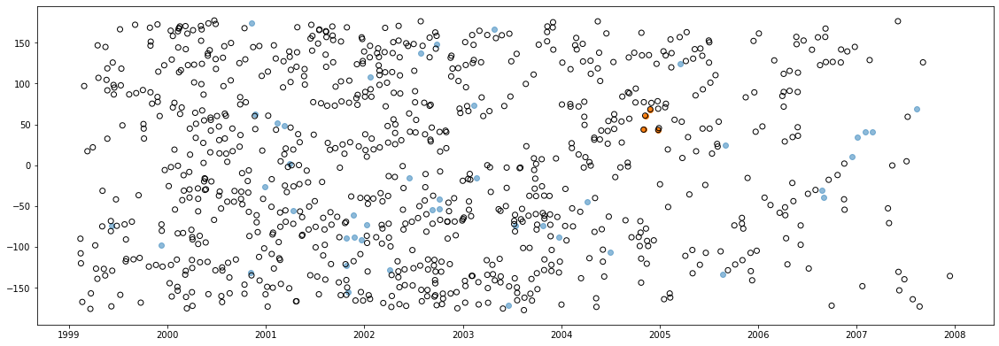

In [167]:
analyzed_region_hh(1998,2008,-25,0,12979)

In [168]:
mask = np.logical_or(allMag.Cycle23n == True, allMag.Cycle23s == True)
mask = np.logical_and(allMag.Year > 1999, allMag.Year < 2005)
mask = np.logical_and(mask, allMag['BMRLatitude']>=-45)
mask = np.logical_and(mask, allMag['BMRLatitude']<0)
mask = np.logical_and(mask, allMag['Hale'] == True)
new_data = allMag[mask]
new_data

,index,Year,Month,Day,Hour,Minute,Second,BMRLabel,PFlux,PArea,...,Cycle24n,Cycle24s,pltSize,BMRColatitude,PColatitude,NColatitude,DBMr,Rot_time,ReferenceDay,CorrectedLongitude
4719,4737,2000,1,6,1,39,2.369,10368,5.528000e+21,2.600000e+19,...,False,False,3.445577,1.857283,1.869998,1.844569,-1.427191e-06,345.0,10962,128.255123
4723,4741,2000,1,9,1,35,2.314,10375,5.016000e+21,2.430000e+19,...,False,False,3.027871,1.838015,1.866909,1.809121,-2.518317e-06,345.0,10965,-153.034786
4724,4742,2000,1,14,1,35,2.229,10378,2.000000e+22,9.400000e+19,...,False,False,6.066300,1.851855,1.903247,1.800464,-1.790917e-05,345.0,10970,-15.410512
4725,4743,2000,1,12,1,39,2.262,10381,4.712000e+21,1.960000e+19,...,False,False,2.889983,2.130646,2.135759,2.125532,-3.567086e-07,345.0,10968,3328.749891
4729,4747,2000,1,13,1,39,2.245,10388,1.224000e+22,6.320000e+19,...,False,False,3.988985,1.906973,1.887574,1.926372,2.872215e-06,345.0,10969,434.265436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6157,6181,2004,12,20,8,3,2.104,12975,8.480000e+21,4.660000e+19,...,False,False,4.053640,1.744276,1.742891,1.745661,2.209375e-07,416.0,12772,45.330930
6158,6182,2004,12,24,8,3,2.096,12976,4.744000e+21,2.890000e+19,...,False,False,3.338263,1.905123,1.898290,1.911956,7.089826e-07,416.0,12776,145.289587
6159,6183,2004,12,26,8,3,2.096,12977,1.568000e+21,1.070000e+19,...,False,False,2.003996,1.847736,1.854220,1.841253,-2.468773e-07,416.0,12778,93.348472
6160,6184,2004,12,26,8,3,2.096,12978,1.672000e+21,1.060000e+19,...,False,False,1.874033,1.705056,1.701380,1.708731,1.260919e-07,416.0,12778,-132.832215


In [169]:
def bool_value(df):
    b_value = True
    for k in df:
        b_value = np.logical_and(b_value, k)
    return(b_value)

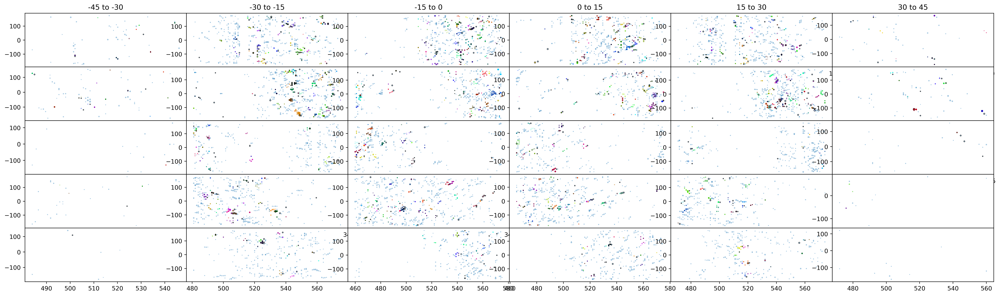

In [170]:
duration = pd.Timedelta(8*365, "d") # In years
t1 = np.min(allMag['Date'])
t2 = np.max(allMag['Date'])

rotation_rate = 25.38 # in days

allMag['Rot_time'] = np.floor((allMag['Date']-np.min(allMag['Date'])).dt.days//rotation_rate)

# allMag['BMRLongitude'] -= 360*allMag['BMRLongitude']//360

ncycles = np.round((t2-t1)/duration)


# Size definitions
dpi = 400
pxx = 1500  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)



size = (np.sqrt(allMag['BMRFlux']/1e21))

for i in np.arange(0,6):

    l1 = -45+i*15
    l2 = -45+(i+1)*15

    for n in np.arange(0,ncycles):
        
        ax1 = fig.add_axes([ppadh+i*ppxx, ppadv-n*ppxy, ppxx, ppxy])

        mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
        mask = np.logical_and(mask, allMag['BMRLatitude']>=l1)
        mask = np.logical_and(mask, allMag['BMRLatitude']<l2)
        ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=0.4, ec='None')




        for label, bmr in dic_90_ah.items():
            mask = np.logical_and(bmr['Date']>=t1+n*duration, bmr['Date']<t1+(n+1)*duration)
            mask = np.logical_and(mask, bmr['BMRLatitude']>=l1)
            mask = np.logical_and(mask, bmr['BMRLatitude']<l2)
            if np.sum(mask>0):
                color = ["#"+''.join([random.choice('ABCDEF0123456789') for i in range(6)])][0]         
                ax1.scatter(bmr.loc[mask,'Rot_time'], bmr.loc[mask,'BMRLongitude'], s=bmr.loc[mask,'pltSize'], alpha=1, ec='None', fc=color)

        mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
        mask = np.logical_and(mask, allMag['BMRLatitude']>=l1)
        mask = np.logical_and(mask, allMag['BMRLatitude']<l2)
        mask = np.logical_and(mask, allMag['AntiHale'])
        ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,ec='k', fc='None', lw=0.5)                

        if n==0:
            ax1.set_title(f'{l1} to {l2}')

     

In [171]:
# lon_tol : 5
# lat_tol : 10
# d_tol   : 180

dic_180_ah = {}
dic_180_hh = {}

for k in range(len(allMag)):
    region = allMag.iloc[k,0:]
    mini_tabla = identifier(allMag, region, 15, 10, 180, 0)    # allMag, region, lat_tol, lon_tol, d_before, d_after

    if mini_tabla.shape[0]>0:

        if region.AntiHale == 1:
            dic_180_ah[region.BMRLabel] = mini_tabla
        else:
            dic_180_hh[region.BMRLabel] = mini_tabla

In [172]:
dic_180_ah

{50:    index  Year  Month  Day  Hour  Minute  Second  BMRLabel         PFlux  \
 0      9  1976      9   17    18      39     3.0        20  3.680000e+21   
 
           PArea  ...  PColatitude  NColatitude      DBMr  Rot_time  \
 0  2.480000e+19  ...     1.767041     1.800045  0.000001       9.0   
 
    ReferenceDay  CorrectedLongitude  BMRid  delta_time  delta_lat  delta_lon  
 0          2451         -124.308871   50.0       -89.0    11.5265   0.696129  
 
 [1 rows x 69 columns],
 86:    index  Year  Month  Day  Hour  Minute  Second  BMRLabel         PFlux  \
 0     36  1977      5    6    18      45    41.0        85  8.200000e+21   
 
           PArea  ...  PColatitude  NColatitude      DBMr  Rot_time  \
 0  3.730000e+19  ...     1.022711     0.943961 -0.000006      18.0   
 
    ReferenceDay  CorrectedLongitude  BMRid  delta_time  delta_lat  delta_lon  
 0          2682          124.592179   86.0        -5.0     1.9325  -7.112821  
 
 [1 rows x 69 columns],
 135:    index  Year

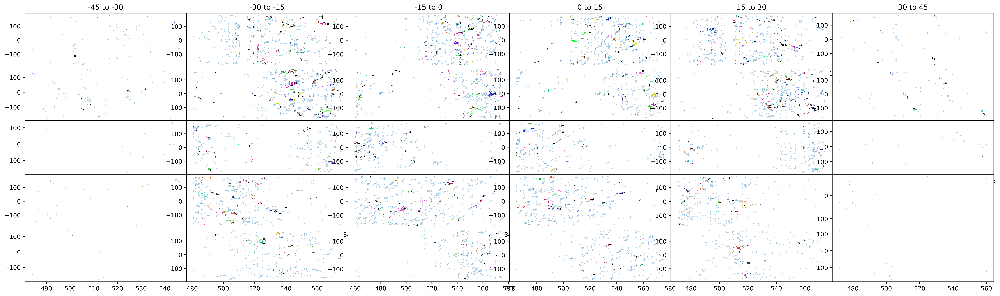

In [173]:
duration = pd.Timedelta(8*365, "d") # In years
t1 = np.min(allMag['Date'])
t2 = np.max(allMag['Date'])

rotation_rate = 25.38 # in days

allMag['Rot_time'] = np.floor((allMag['Date']-np.min(allMag['Date'])).dt.days//rotation_rate)

# allMag['BMRLongitude'] -= 360*allMag['BMRLongitude']//360

ncycles = np.round((t2-t1)/duration)


# Size definitions
dpi = 400
pxx = 1500  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)

size = (np.sqrt(allMag['BMRFlux']/1e21))

for i in np.arange(0,6):

    l1 = -45+i*15
    l2 = -45+(i+1)*15

    for n in np.arange(0,ncycles):
        
        ax1 = fig.add_axes([ppadh+i*ppxx, ppadv-n*ppxy, ppxx, ppxy])

        mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
        mask = np.logical_and(mask, allMag['BMRLatitude']>=l1)
        mask = np.logical_and(mask, allMag['BMRLatitude']<l2)
        ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=0.4, ec='None')




        for label, bmr in dic_180_ah.items():
            mask = np.logical_and(bmr['Date']>=t1+n*duration, bmr['Date']<t1+(n+1)*duration)
            mask = np.logical_and(mask, bmr['BMRLatitude']>=l1)
            mask = np.logical_and(mask, bmr['BMRLatitude']<l2)
            if np.sum(mask>0):
                color = ["#"+''.join([random.choice('ABCDEF0123456789') for i in range(6)])][0]         
                ax1.scatter(bmr.loc[mask,'Rot_time'], bmr.loc[mask,'BMRLongitude'], s=bmr.loc[mask,'pltSize'], alpha=1, ec='None', fc=color)

        mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
        mask = np.logical_and(mask, allMag['BMRLatitude']>=l1)
        mask = np.logical_and(mask, allMag['BMRLatitude']<l2)
        mask = np.logical_and(mask, allMag['AntiHale'])
        ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,ec='k', fc='None', lw=0.5)                

        if n==0:
            ax1.set_title(f'{l1} to {l2}')

In [174]:
neighborhood_ah = pd.DataFrame()
neighborhood_hh = pd.DataFrame()

for label, bmr in dic_90_ah.items():
    neighborhood_ah = neighborhood_ah.append(bmr, ignore_index=True)

for label, bmr in dic_90_hh.items():
    neighborhood_hh = neighborhood_hh.append(bmr, ignore_index=True)

In [175]:
from scipy import stats

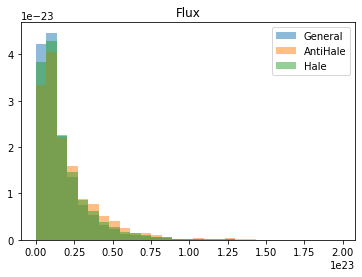

In [176]:
# flux

bins_flux = np.linspace(0, allMag['BMRFlux'].max(), 30)

plt.hist(allMag.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='General')
plt.hist(neighborhood_ah.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='AntiHale')
plt.hist(neighborhood_hh.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='Hale')
plt.title('Flux')
plt.legend()
plt.show()

In [177]:
stats.ks_2samp(neighborhood_ah.BMRFlux, neighborhood_hh.BMRFlux)

KstestResult(statistic=0.060800970817302624, pvalue=3.258765514065381e-07)

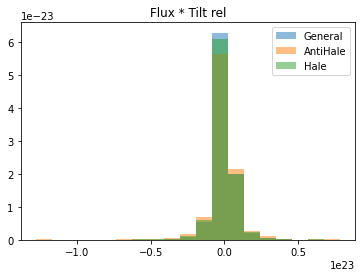

In [178]:
# flux x tilt rel

t = allMag.BMRFlux * np.sin(allMag.Tilt_rel * np.pi/180)
bins_flux_tilt = np.linspace(t.min(), t.max(), 20)

plt.hist(allMag.BMRFlux * np.sin(allMag.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='General')
plt.hist(neighborhood_ah.BMRFlux * np.sin(neighborhood_ah.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='AntiHale')
plt.hist(neighborhood_hh.BMRFlux * np.sin(neighborhood_hh.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='Hale')
plt.title('Flux * Tilt rel')
plt.legend()
plt.show()

In [179]:
stats.ks_2samp(neighborhood_ah.BMRFlux * np.sin(neighborhood_ah.Tilt_rel * np.pi/180), neighborhood_hh.BMRFlux * np.sin(neighborhood_hh.Tilt_rel * np.pi/180))

KstestResult(statistic=0.03265161043463116, pvalue=0.021886624728059183)

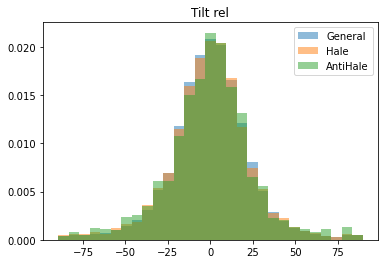

In [180]:
# tilt rel

bins_tilt_rel = np.linspace(allMag.Tilt_rel.min(), allMag.Tilt_rel.max(), 30)

plt.hist(allMag.Tilt_rel, density=True, alpha=0.5, bins=bins_tilt_rel, label='General')
plt.hist(neighborhood_hh.Tilt_rel, density=True, alpha=0.5, bins=bins_tilt_rel, label='Hale')
plt.hist(neighborhood_ah.Tilt_rel, density=True, alpha=0.5, bins=bins_tilt_rel, label='AntiHale')
plt.title('Tilt rel')
plt.legend()
plt.show()

In [181]:
stats.ks_2samp(neighborhood_hh.Tilt_rel, neighborhood_ah.Tilt_rel)

KstestResult(statistic=0.020743043854176954, pvalue=0.32045776718009855)

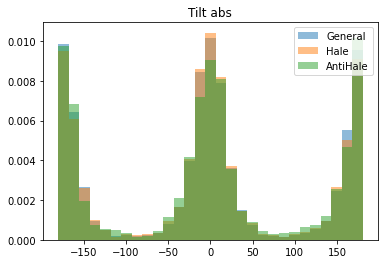

In [182]:
# tilt abs

bins_tilt_abs = np.linspace(allMag.Tilt_abs.min(), allMag.Tilt_abs.max(), 30)


plt.hist(allMag.Tilt_abs, density=True, alpha=0.5, bins=bins_tilt_abs, label='General')
plt.hist(neighborhood_hh.Tilt_abs, density=True, alpha=0.5, bins=bins_tilt_abs, label='Hale')
plt.hist(neighborhood_ah.Tilt_abs, density=True, alpha=0.5, bins=bins_tilt_abs, label='AntiHale')
plt.title('Tilt abs')
plt.legend()
plt.show()

In [183]:
stats.ks_2samp(neighborhood_hh.Tilt_abs, neighborhood_ah.Tilt_abs)

KstestResult(statistic=0.025660092209233487, pvalue=0.12258231750943227)

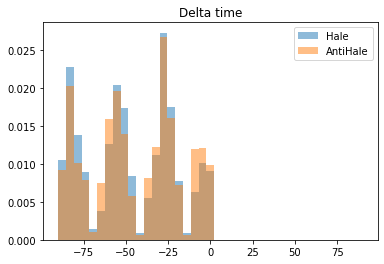

In [184]:
# delta_time

bins_delta_t = np.linspace(-90, 90, 40)

plt.hist(neighborhood_hh.delta_time, density=True, alpha=0.5, bins=bins_delta_t, label='Hale')
plt.hist(neighborhood_ah.delta_time, density=True, alpha=0.5, bins=bins_delta_t, label='AntiHale')
plt.title('Delta time')
plt.legend()
plt.show()

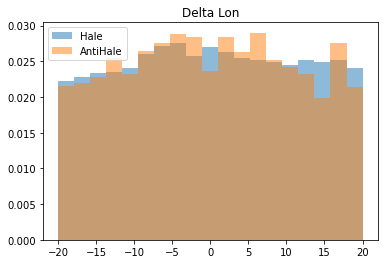

In [185]:
# delta_lon
 
bins_delta_lon = np.linspace(-20, 20, 20)

plt.hist(neighborhood_hh.delta_lon, density=True, alpha=0.5, bins=bins_delta_lon, label='Hale')
plt.hist(neighborhood_ah.delta_lon, density=True, alpha=0.5, bins=bins_delta_lon, label='AntiHale')
plt.title('Delta Lon')
plt.legend()
plt.show()

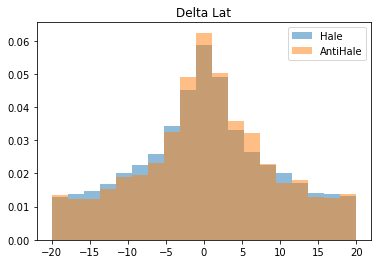

In [186]:
# delta_lat

bins_delta_lat = np.linspace(-20, 20, 20)

plt.hist(neighborhood_hh.delta_lat, density=True, alpha=0.5, bins=bins_delta_lat, label='Hale')
plt.hist(neighborhood_ah.delta_lat, density=True, alpha=0.5, bins=bins_delta_lat, label='AntiHale')
plt.title('Delta Lat')
plt.legend()
plt.show()

# Separation by cycle

In [187]:
neighborhood_ah_21n_23n = pd.DataFrame()
neighborhood_hh_21n_23n = pd.DataFrame()

neighborhood_ah_21s_23s = pd.DataFrame()
neighborhood_hh_21s_23s = pd.DataFrame()

neighborhood_ah_22n_24n = pd.DataFrame()
neighborhood_hh_22n_24n = pd.DataFrame()

neighborhood_ah_22s_24s = pd.DataFrame()
neighborhood_hh_22s_24s = pd.DataFrame()

for label, bmr in dic_180_ah.items():
    label_pos = (allMag.BMRLabel == label)
    region = allMag[label_pos]
    if (region.AH_21n.bool()==True) or (region.AH_23n.bool()==True):
        neighborhood_ah_21n_23n = neighborhood_ah_21n_23n.append(bmr, ignore_index=True)

for label, bmr in dic_180_hh.items():
    label_pos = (allMag.BMRLabel == label)
    region = allMag[label_pos]
    if (region.HH_21n.bool()==True) or (region.HH_23n.bool()==True):
        neighborhood_hh_21n_23n = neighborhood_hh_21n_23n.append(bmr, ignore_index=True)

for label, bmr in dic_180_ah.items():
    label_pos = (allMag.BMRLabel == label)
    region = allMag[label_pos]
    if (region.AH_21s.bool()==True) or (region.AH_23s.bool()==True):
        neighborhood_ah_21s_23s = neighborhood_ah_21s_23s.append(bmr, ignore_index=True)

for label, bmr in dic_180_hh.items():
    label_pos = (allMag.BMRLabel == label)
    region = allMag[label_pos]
    if (region.HH_21s.bool()==True) or (region.HH_23s.bool()==True):
        neighborhood_hh_21s_23s = neighborhood_hh_21s_23s.append(bmr, ignore_index=True)

for label, bmr in dic_180_ah.items():
    label_pos = (allMag.BMRLabel == label)
    region = allMag[label_pos]
    if (region.AH_22n.bool()==True) or (region.AH_24n.bool()==True):
        neighborhood_ah_22n_24n = neighborhood_ah_22n_24n.append(bmr, ignore_index=True)

for label, bmr in dic_180_hh.items():
    label_pos = (allMag.BMRLabel == label)
    region = allMag[label_pos]
    if (region.HH_22n.bool()==True) or (region.HH_24n.bool()==True):
        neighborhood_hh_22n_24n = neighborhood_hh_22n_24n.append(bmr, ignore_index=True)

for label, bmr in dic_180_ah.items():
    label_pos = (allMag.BMRLabel == label)
    region = allMag[label_pos]
    if (region.AH_22s.bool()==True) or (region.AH_24s.bool()==True):
        neighborhood_ah_22s_24s = neighborhood_ah_22s_24s.append(bmr, ignore_index=True)

for label, bmr in dic_180_hh.items():
    label_pos = (allMag.BMRLabel == label)
    region = allMag[label_pos]
    if (region.HH_22s.bool()==True) or (region.HH_24s.bool()==True):
        neighborhood_hh_22s_24s = neighborhood_hh_22s_24s.append(bmr, ignore_index=True)


In [188]:
#u, index = np.unique(neighborhood_ah_21n_23n.BMRLabel, return_index=True) 
#neighborhood_ah_21n_23n = neighborhood_ah_21n_23n.loc[index,:].reset_index(drop=True)

#u, index = np.unique(neighborhood_ah_21s_23s.BMRLabel, return_index=True) 
#neighborhood_ah_21s_23s = neighborhood_ah_21s_23s.loc[index,:].reset_index(drop=True)

u, index = np.unique(neighborhood_ah_22n_24n.BMRLabel, return_index=True) 
neighborhood_ah_22n_24n = neighborhood_ah_22n_24n.loc[index,:].reset_index(drop=True)

u, index = np.unique(neighborhood_ah_22s_24s.BMRLabel, return_index=True) 
neighborhood_ah_22s_24s = neighborhood_ah_22s_24s.loc[index,:].reset_index(drop=True)

In [189]:
general_21n_23n = neighborhood_ah_21n_23n
general_21n_23n = general_21n_23n.append(neighborhood_hh_21n_23n)

general_21s_23s = neighborhood_ah_21s_23s
general_21s_23s = general_21s_23s.append(neighborhood_hh_21s_23s)

general_22n_24n = neighborhood_ah_22n_24n
general_22n_24n = general_22n_24n.append(neighborhood_hh_22n_24n)

general_22s_24s = neighborhood_ah_22s_24s
general_22s_24s = general_22s_24s.append(neighborhood_hh_22s_24s)

Text(0.5, 1.0, '22s-24s')

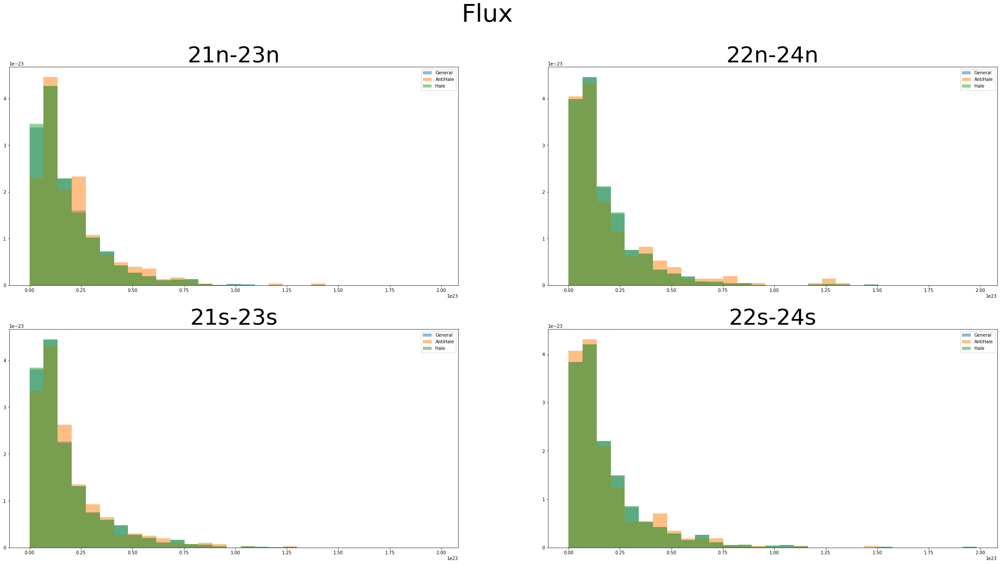

In [190]:
# flux

fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(40,20))
fig.suptitle('Flux', fontsize=56)

bins_flux = np.linspace(0, allMag['BMRFlux'].max(), 30)

axs[0,0].hist(general_21n_23n.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='General')
axs[0,0].hist(neighborhood_ah_21n_23n.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='AntiHale')
axs[0,0].hist(neighborhood_hh_21n_23n.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='Hale')
axs[0,0].legend()
axs[0,0].set_title('21n-23n', fontsize=50)

axs[1,0].hist(general_21s_23s.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='General')
axs[1,0].hist(neighborhood_ah_21s_23s.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='AntiHale')
axs[1,0].hist(neighborhood_hh_21s_23s.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='Hale')
axs[1,0].legend()
axs[1,0].set_title('21s-23s', fontsize=50)

axs[0,1].hist(general_22n_24n.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='General')
axs[0,1].hist(neighborhood_ah_22n_24n.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='AntiHale')
axs[0,1].hist(neighborhood_hh_22n_24n.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='Hale')
axs[0,1].legend()
axs[0,1].set_title('22n-24n', fontsize=50)

axs[1,1].hist(general_22s_24s.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='General')
axs[1,1].hist(neighborhood_ah_22s_24s.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='AntiHale')
axs[1,1].hist(neighborhood_hh_22s_24s.BMRFlux, density=True, bins=bins_flux, alpha=0.5, label='Hale')
axs[1,1].legend()
axs[1,1].set_title('22s-24s', fontsize=50)



In [191]:
print('AH 21n_23n mean: ', np.mean(neighborhood_ah_21n_23n.BMRFlux), ' std: ', np.std(neighborhood_ah_21n_23n.BMRFlux))
print('HH 21n_23n mean: ', np.mean(neighborhood_hh_21n_23n.BMRFlux), ' std: ', np.std(neighborhood_hh_21n_23n.BMRFlux))

print('AH 21s_23s mean: ', np.mean(neighborhood_ah_21s_23s.BMRFlux), ' std: ', np.std(neighborhood_ah_21s_23s.BMRFlux))
print('HH 21s_23s mean: ', np.mean(neighborhood_hh_21s_23s.BMRFlux), ' std: ', np.std(neighborhood_hh_21s_23s.BMRFlux))

print('AH 22n_24n mean: ', np.mean(neighborhood_ah_22n_24n.BMRFlux), ' std: ', np.std(neighborhood_ah_22n_24n.BMRFlux))
print('HH 22n_24n mean: ', np.mean(neighborhood_hh_22n_24n.BMRFlux), ' std: ', np.std(neighborhood_hh_22n_24n.BMRFlux))

print('AH 22s_24s mean: ', np.mean(neighborhood_ah_22s_24s.BMRFlux), ' std: ', np.std(neighborhood_ah_22s_24s.BMRFlux))
print('HH 22s_24s mean: ', np.mean(neighborhood_hh_22s_24s.BMRFlux), ' std: ', np.std(neighborhood_hh_22s_24s.BMRFlux))

AH 21n_23n mean:  2.091526233183858e+22  std:  1.7654339945111218e+22
HH 21n_23n mean:  1.8488954733559934e+22  std:  1.6323558817844624e+22
AH 21s_23s mean:  1.884493264957268e+22  std:  1.7896033214062112e+22
HH 21s_23s mean:  1.7864503020134217e+22  std:  1.708126929380008e+22
AH 22n_24n mean:  2.0148828947368425e+22  std:  2.2334261345719465e+22
HH 22n_24n mean:  1.7000064787252735e+22  std:  1.6508274642648725e+22
AH 22s_24s mean:  1.8422785145888597e+22  std:  1.888112623194731e+22
HH 22s_24s mean:  1.8697837697052736e+22  std:  1.9122154821463356e+22


Text(0.5, 1.0, '22s-24s')

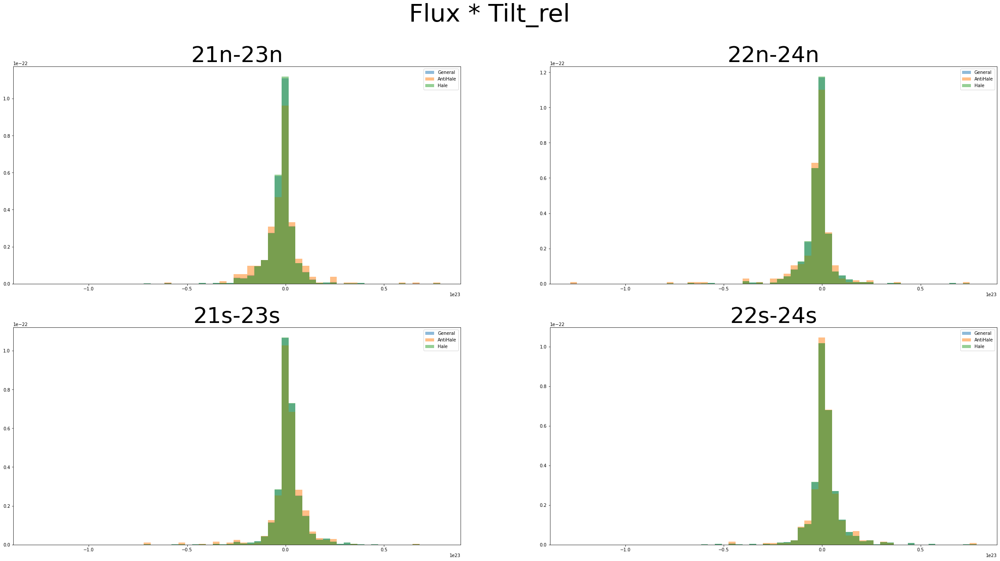

In [192]:
# flux x tilt rel

fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(40,20))
fig.suptitle('Flux * Tilt_rel', fontsize=56)

t = allMag.BMRFlux * np.sin(allMag.Tilt_rel * np.pi/180)
bins_flux_tilt = np.linspace(t.min(), t.max(), 60)

axs[0,0].hist(general_21n_23n.BMRFlux * np.sin(general_21n_23n.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='General')
axs[0,0].hist(neighborhood_ah_21n_23n.BMRFlux * np.sin(neighborhood_ah_21n_23n.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='AntiHale')
axs[0,0].hist(neighborhood_hh_21n_23n.BMRFlux * np.sin(neighborhood_hh_21n_23n.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='Hale')
axs[0,0].legend()
axs[0,0].set_title('21n-23n', fontsize=50)

axs[1,0].hist(general_21s_23s.BMRFlux * np.sin(general_21s_23s.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='General')
axs[1,0].hist(neighborhood_ah_21s_23s.BMRFlux * np.sin(neighborhood_ah_21s_23s.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='AntiHale')
axs[1,0].hist(neighborhood_hh_21s_23s.BMRFlux * np.sin(neighborhood_hh_21s_23s.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='Hale')
axs[1,0].legend()
axs[1,0].set_title('21s-23s', fontsize=50)

axs[0,1].hist(general_22n_24n.BMRFlux * np.sin(general_22n_24n.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='General')
axs[0,1].hist(neighborhood_ah_22n_24n.BMRFlux * np.sin(neighborhood_ah_22n_24n.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='AntiHale')
axs[0,1].hist(neighborhood_hh_22n_24n.BMRFlux * np.sin(neighborhood_hh_22n_24n.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='Hale')
axs[0,1].legend()
axs[0,1].set_title('22n-24n', fontsize=50)

axs[1,1].hist(general_22s_24s.BMRFlux * np.sin(general_22s_24s.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='General')
axs[1,1].hist(neighborhood_ah_22s_24s.BMRFlux * np.sin(neighborhood_ah_22s_24s.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='AntiHale')
axs[1,1].hist(neighborhood_hh_22s_24s.BMRFlux * np.sin(neighborhood_hh_22s_24s.Tilt_rel * np.pi/180), density=True, bins=bins_flux_tilt, alpha=0.5, label='Hale')
axs[1,1].legend()
axs[1,1].set_title('22s-24s', fontsize=50)

In [193]:
print('AH 21n_23n mean: ', np.mean(neighborhood_ah_21n_23n.BMRFlux* np.sin(neighborhood_ah_21n_23n.Tilt_rel * np.pi/180)), ' std: ', np.std(neighborhood_ah_21n_23n.BMRFlux* np.sin(neighborhood_ah_21n_23n.Tilt_rel * np.pi/180)))
print('HH 21n_23n mean: ', np.mean(neighborhood_hh_21n_23n.BMRFlux* np.sin(neighborhood_hh_21n_23n.Tilt_rel * np.pi/180)), ' std: ', np.std(neighborhood_hh_21n_23n.BMRFlux* np.sin(neighborhood_hh_21n_23n.Tilt_rel * np.pi/180)))

print('AH 21s_23s mean: ', np.mean(neighborhood_ah_21s_23s.BMRFlux * np.sin(neighborhood_ah_21s_23s.Tilt_rel * np.pi/180)), ' std: ', np.std(neighborhood_ah_21s_23s.BMRFlux * np.sin(neighborhood_ah_21s_23s.Tilt_rel * np.pi/180)))
print('HH 21s_23s mean: ', np.mean(neighborhood_hh_21s_23s.BMRFlux * np.sin(neighborhood_hh_21s_23s.Tilt_rel * np.pi/180)), ' std: ', np.std(neighborhood_hh_21s_23s.BMRFlux * np.sin(neighborhood_hh_21s_23s.Tilt_rel * np.pi/180)))

print('AH 22n_24n mean: ', np.mean(neighborhood_ah_22n_24n.BMRFlux * np.sin(neighborhood_ah_22n_24n.Tilt_rel * np.pi/180)), ' std: ', np.std(neighborhood_ah_22n_24n.BMRFlux * np.sin(neighborhood_ah_22n_24n.Tilt_rel * np.pi/180)))
print('HH 22n_24n mean: ', np.mean(neighborhood_hh_22n_24n.BMRFlux * np.sin(neighborhood_hh_22n_24n.Tilt_rel * np.pi/180)), ' std: ', np.std(neighborhood_hh_22n_24n.BMRFlux * np.sin(neighborhood_hh_22n_24n.Tilt_rel * np.pi/180)))

print('AH 22s_24s mean: ', np.mean(neighborhood_ah_22s_24s.BMRFlux * np.sin(neighborhood_ah_22s_24s.Tilt_rel * np.pi/180)), ' std: ', np.std(neighborhood_ah_22s_24s.BMRFlux * np.sin(neighborhood_ah_22s_24s.Tilt_rel * np.pi/180)))
print('HH 22s_24s mean: ', np.mean(neighborhood_hh_22s_24s.BMRFlux * np.sin(neighborhood_hh_22s_24s.Tilt_rel * np.pi/180)), ' std: ', np.std(neighborhood_hh_22s_24s.BMRFlux * np.sin(neighborhood_hh_22s_24s.Tilt_rel * np.pi/180)))

AH 21n_23n mean:  -2.03953044154337e+21  std:  1.0602575738370464e+22
HH 21n_23n mean:  -2.2774580355740423e+21  std:  7.958721801819101e+21
AH 21s_23s mean:  1.2297483859604003e+21  std:  9.573368514869602e+21
HH 21s_23s mean:  1.6282606341232088e+21  std:  7.743442920973998e+21
AH 22n_24n mean:  -3.454541125093282e+21  std:  1.3728494272179436e+22
HH 22n_24n mean:  -2.2897568630445092e+21  std:  8.744931912547289e+21
AH 22s_24s mean:  1.7023089602234782e+21  std:  8.663919851862424e+21
HH 22s_24s mean:  1.7641894661510492e+21  std:  8.773375428699295e+21


Text(0.5, 1.0, '22s-24s')

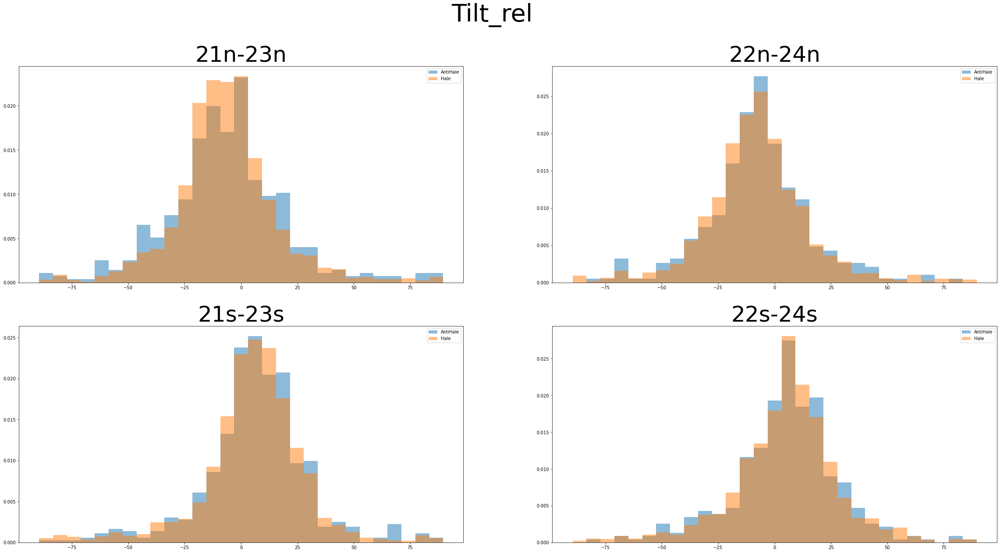

In [194]:
# tilt rel

fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(40,20))
fig.suptitle('Tilt_rel', fontsize=56)

bins_tilt_rel = np.linspace(allMag.Tilt_rel.min(), allMag.Tilt_rel.max(), 30)

#axs[0,0].hist(general_21n_23n.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='General')
axs[0,0].hist(neighborhood_ah_21n_23n.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='AntiHale')
axs[0,0].hist(neighborhood_hh_21n_23n.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='Hale')
axs[0,0].legend()
axs[0,0].set_title('21n-23n', fontsize=50)

#axs[1,0].hist(general_21s_23s.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='General')
axs[1,0].hist(neighborhood_ah_21s_23s.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='AntiHale')
axs[1,0].hist(neighborhood_hh_21s_23s.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='Hale')
axs[1,0].legend()
#axs[1,0].invert_xaxis()
axs[1,0].set_title('21s-23s', fontsize=50)

#axs[0,1].hist(general_22n_24n.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='General')
axs[0,1].hist(neighborhood_ah_22n_24n.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='AntiHale')
axs[0,1].hist(neighborhood_hh_22n_24n.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='Hale')
axs[0,1].legend()
axs[0,1].set_title('22n-24n', fontsize=50)

#axs[1,1].hist(general_22s_24s.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='General')
axs[1,1].hist(neighborhood_ah_22s_24s.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='AntiHale')
axs[1,1].hist(neighborhood_hh_22s_24s.Tilt_rel, density=True, bins=bins_tilt_rel, alpha=0.5, label='Hale')
axs[1,1].legend()
#axs[1,1].invert_xaxis()
axs[1,1].set_title('22s-24s', fontsize=50)

In [195]:
print('AH 21n_23n mean: ', np.mean(neighborhood_ah_21n_23n.Tilt_rel), ' std: ', np.std(neighborhood_ah_21n_23n.Tilt_rel))
print('HH 21n_23n mean: ', np.mean(neighborhood_hh_21n_23n.Tilt_rel), ' std: ', np.std(neighborhood_hh_21n_23n.Tilt_rel))

print('AH 21s_23s mean: ', np.mean(neighborhood_ah_21s_23s.Tilt_rel), ' std: ', np.std(neighborhood_ah_21s_23s.Tilt_rel))
print('HH 21s_23s mean: ', np.mean(neighborhood_hh_21s_23s.Tilt_rel), ' std: ', np.std(neighborhood_hh_21s_23s.Tilt_rel))

print('AH 22n_24n mean: ', np.mean(neighborhood_ah_22n_24n.Tilt_rel), ' std: ', np.std(neighborhood_ah_22n_24n.Tilt_rel))
print('HH 22n_24n mean: ', np.mean(neighborhood_hh_22n_24n.Tilt_rel), ' std: ', np.std(neighborhood_hh_22n_24n.Tilt_rel))

print('AH 22s_24s mean: ', np.mean(neighborhood_ah_22s_24s.Tilt_rel), ' std: ', np.std(neighborhood_ah_22s_24s.Tilt_rel))
print('HH 22s_24s mean: ', np.mean(neighborhood_hh_22s_24s.Tilt_rel), ' std: ', np.std(neighborhood_hh_22s_24s.Tilt_rel))

AH 21n_23n mean:  -6.605362621433906  std:  26.4618881678426
HH 21n_23n mean:  -6.668320066582498  std:  22.28816938194282
AH 21s_23s mean:  6.661532374587772  std:  23.258834202038308
HH 21s_23s mean:  5.262368127999693  std:  22.885947214755102
AH 22n_24n mean:  -7.5754926049892175  std:  23.079611681151075
HH 22n_24n mean:  -7.803957295883722  std:  23.165911964355868
AH 22s_24s mean:  4.952793399166954  std:  22.89697624421213
HH 22s_24s mean:  5.036467802434067  std:  23.18796043368296


Text(0.5, 1.0, '22s-24s')

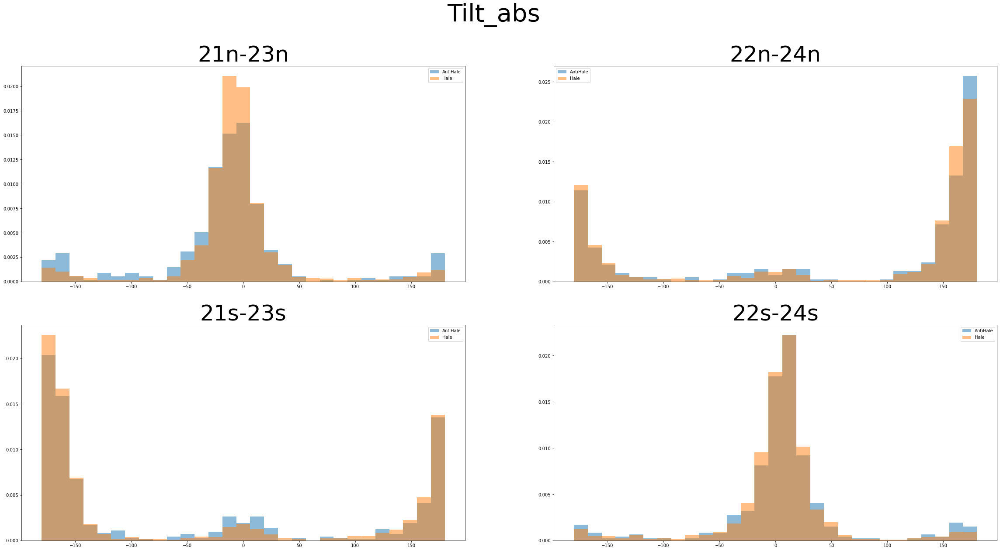

In [196]:
# tilt abs

fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(40,20))
fig.suptitle('Tilt_abs', fontsize=56)

bins_tilt_abs = np.linspace(allMag.Tilt_abs.min(), allMag.Tilt_abs.max(), 30)

#axs[0,0].hist(general_21n_23n.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='General')
axs[0,0].hist(neighborhood_ah_21n_23n.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='AntiHale')
axs[0,0].hist(neighborhood_hh_21n_23n.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='Hale')
axs[0,0].legend()
axs[0,0].set_title('21n-23n', fontsize=50)

#axs[1,0].hist(general_21s_23s.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='General')
axs[1,0].hist(neighborhood_ah_21s_23s.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='AntiHale')
axs[1,0].hist(neighborhood_hh_21s_23s.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='Hale')
axs[1,0].legend()
axs[1,0].set_title('21s-23s', fontsize=50)

#axs[0,1].hist(general_22n_24n.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='General')
axs[0,1].hist(neighborhood_ah_22n_24n.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='AntiHale')
axs[0,1].hist(neighborhood_hh_22n_24n.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='Hale')
axs[0,1].legend()
axs[0,1].set_title('22n-24n', fontsize=50)

#axs[1,1].hist(general_22s_24s.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='General')
axs[1,1].hist(neighborhood_ah_22s_24s.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='AntiHale')
axs[1,1].hist(neighborhood_hh_22s_24s.Tilt_abs, density=True, bins=bins_tilt_abs, alpha=0.5, label='Hale')
axs[1,1].legend()
axs[1,1].set_title('22s-24s', fontsize=50)

In [197]:
print('AH 21n_23n mean: ', np.mean(neighborhood_ah_21n_23n.Tilt_abs), ' std: ', np.std(neighborhood_ah_21n_23n.Tilt_abs))
print('HH 21n_23n mean: ', np.mean(neighborhood_hh_21n_23n.Tilt_abs), ' std: ', np.std(neighborhood_hh_21n_23n.Tilt_abs))

print('AH 21s_23s mean: ', np.mean(neighborhood_ah_21s_23s.Tilt_abs), ' std: ', np.std(neighborhood_ah_21s_23s.Tilt_abs))
print('HH 21s_23s mean: ', np.mean(neighborhood_hh_21s_23s.Tilt_abs), ' std: ', np.std(neighborhood_hh_21s_23s.Tilt_abs))

print('AH 22n_24n mean: ', np.mean(neighborhood_ah_22n_24n.Tilt_abs), ' std: ', np.std(neighborhood_ah_22n_24n.Tilt_abs))
print('HH 22n_24n mean: ', np.mean(neighborhood_hh_22n_24n.Tilt_abs), ' std: ', np.std(neighborhood_hh_22n_24n.Tilt_abs))

print('AH 22s_24s mean: ', np.mean(neighborhood_ah_22s_24s.Tilt_abs), ' std: ', np.std(neighborhood_ah_22s_24s.Tilt_abs))
print('HH 22s_24s mean: ', np.mean(neighborhood_hh_22s_24s.Tilt_abs), ' std: ', np.std(neighborhood_hh_22s_24s.Tilt_abs))

AH 21n_23n mean:  -13.06276172457292  std:  65.73934474852783
HH 21n_23n mean:  -7.484646597194743  std:  50.61876323468102
AH 21s_23s mean:  -49.33846762541222  std:  143.67056680471126
HH 21s_23s mean:  -51.237373740870055  std:  148.14481447127596
AH 22n_24n mean:  62.29292844764236  std:  141.33051041999593
HH 22n_24n mean:  61.5043950066901  std:  143.49698070033602
AH 22s_24s mean:  5.907700560970671  std:  56.49957106481237
HH 22s_24s mean:  4.098839289754177  std:  48.02554203760446


In [198]:
KPVT['NpixelAvgRadius']

0       2.91760
1       1.09870
2       1.42780
3       1.33190
4       0.96402
         ...   
4329    4.65080
4330    1.61460
4331    2.87700
4332    3.12970
4333    3.09340
Name: NpixelAvgRadius, Length: 3762, dtype: float64

In [199]:
# allMag

BMR_R = (allMag['PpixelAvgRadius'] + allMag['NpixelAvgRadius'])/2

DBMr = 3/(4*np.pi)*allMag['BMRFlux']/(allMag['BMRArea']*1e4)*BMR_R*np.pi/180

DBMr_HH = DBMr[allMag.Hale]*2*np.cos(allMag[allMag.Hale].BMRLatitude*np.pi/180)*( np.sin(allMag[allMag.Hale].PLatitude*np.pi/180) - np.sin(allMag[allMag.Hale].NLatitude*np.pi/180) )

DBMr_AH = -DBMr[allMag.AntiHale]*2*np.cos(allMag[allMag.AntiHale].BMRLatitude*np.pi/180)*( np.sin(allMag[allMag.AntiHale].NLatitude*np.pi/180) - np.sin(allMag[allMag.AntiHale].PLatitude*np.pi/180) )

In [200]:
HH = allMag[allMag.Hale]
AH = allMag[allMag.AntiHale]

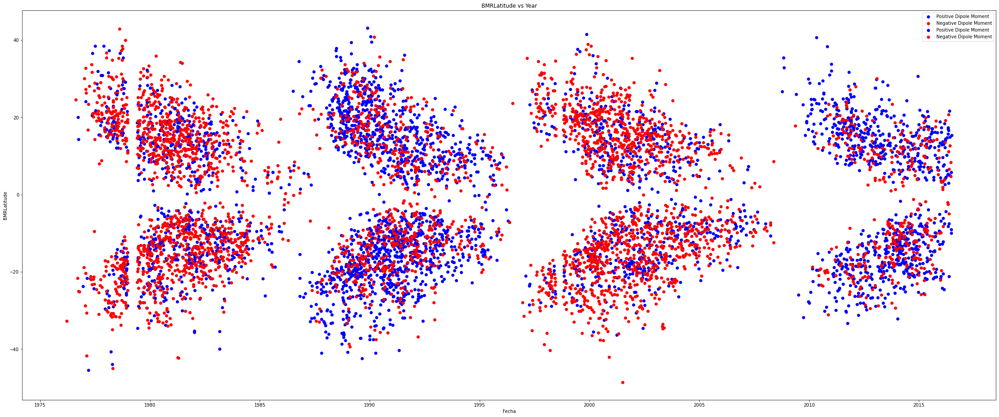

In [201]:
fig = plt.figure()
ax = fig.add_axes([0.1, 0.1, 5, 3])
ax.scatter(HH[DBMr_HH>0].Date, HH[DBMr_HH>0].BMRLatitude, vmin=-90, vmax=90, label='Positive Dipole Moment', color='b')
ax.scatter(HH[DBMr_HH<0].Date, HH[DBMr_HH<0].BMRLatitude, vmin=-90, vmax=90, label='Negative Dipole Moment', color='r')
ax.scatter(AH[DBMr_AH>0].Date, AH[DBMr_AH>0].BMRLatitude, vmin=-90, vmax=90, label='Positive Dipole Moment', color='b')
ax.scatter(AH[DBMr_AH<0].Date, AH[DBMr_AH<0].BMRLatitude, vmin=-90, vmax=90, label='Negative Dipole Moment', color='r')
ax.set_title('BMRLatitude vs Year')
ax.set_xlabel('Fecha')
ax.set_ylabel('BMRLatitude')
ax.legend()
plt.show()

In [202]:
np.max(DBMr_HH)

0.00024218831199851487

In [203]:
np.max(DBMr_AH)

0.00019507731926017067

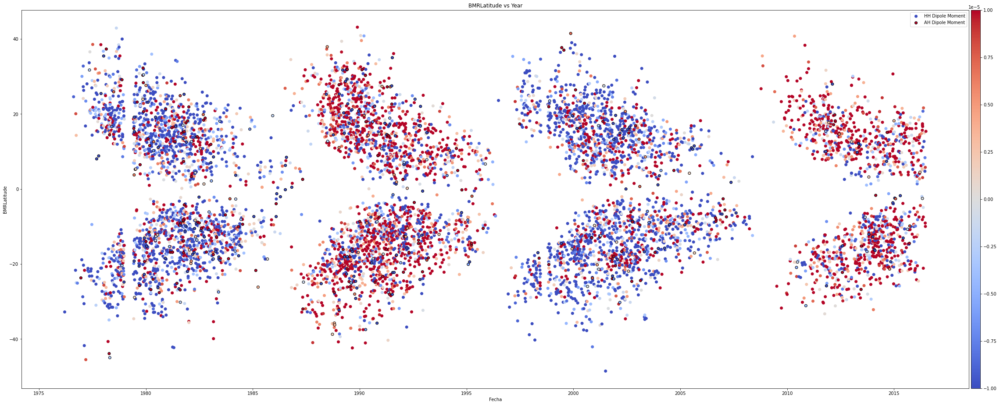

In [204]:
vlim = 1e-5

fig = plt.figure()
ax = fig.add_axes([0.1, 0.1, 5, 3])
c = ax.scatter(HH.Date, HH.BMRLatitude, label='HH Dipole Moment', c=DBMr_HH, cmap='coolwarm', vmax=vlim, vmin=-vlim)
ax.scatter(AH.Date, AH.BMRLatitude, label='AH Dipole Moment', c=DBMr_AH, cmap='coolwarm', vmax=vlim, vmin=-vlim, edgecolor='k')
colorbar_ax = fig.add_axes([5.11, 0.1, 0.05, 3])
fig.colorbar(c, cax=colorbar_ax)
ax.set_title('BMRLatitude vs Year')
ax.set_xlabel('Fecha')
ax.set_ylabel('BMRLatitude')
ax.legend()
plt.show()

In [205]:
allMag.columns

Index(['index', 'Year', 'Month', 'Day', 'Hour', 'Minute', 'Second', 'BMRLabel',
       'PFlux', 'PArea', 'PLatitude', 'PLongitude', 'PpixelAvgRadius', 'NFlux',
       'NArea', 'NLatitude', 'NLongitude', 'NpixelAvgRadius', 'R',
       'LeadingPolarity', 'DayAfterChrist', 'FRACYEAR', 'PlotSize',
       'BMRLatitude', 'BMRLongitude', 'BMRArea', 'BMRFlux', 'Tilt_rel',
       'Tilt_abs', 'HH_21n', 'AH_21n', 'HH_21s', 'AH_21s', 'HH_22n', 'AH_22n',
       'HH_22s', 'AH_22s', 'Cycle21n', 'Cycle21s', 'Cycle22n', 'Cycle22s',
       'Hale', 'AntiHale', 'Date', 'Instrument', 'HH_23n', 'AH_23n', 'HH_23s',
       'AH_23s', 'Cycle23n', 'Cycle23s', 'HH_24n', 'AH_24n', 'HH_24s',
       'AH_24s', 'Cycle24n', 'Cycle24s', 'pltSize', 'BMRColatitude',
       'PColatitude', 'NColatitude', 'DBMr', 'Rot_time', 'ReferenceDay',
       'CorrectedLongitude'],
      dtype='object')

Text(0.5, 1.0, '22s-24s')

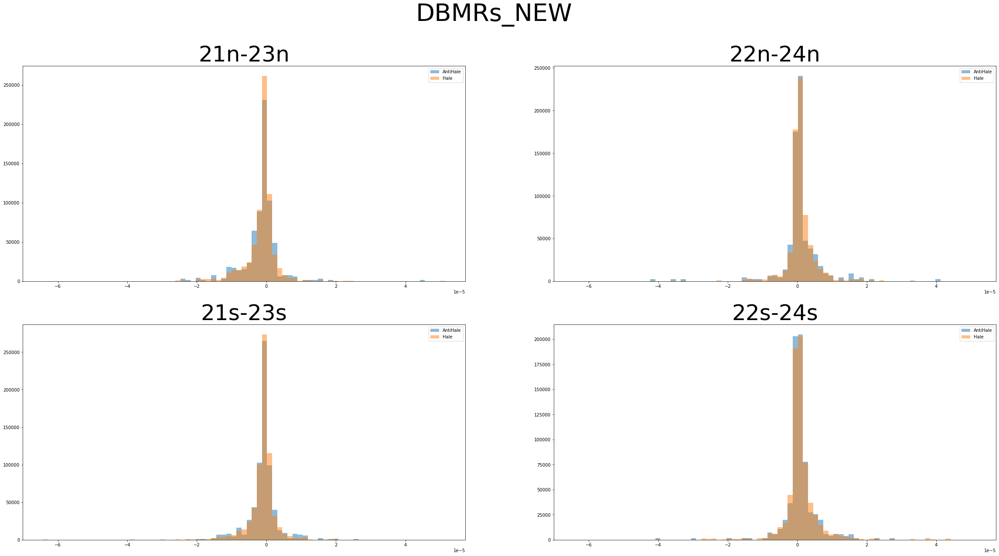

In [206]:
# BMRs

fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(40,20))
fig.suptitle('DBMRs_NEW', fontsize=56)

bins_dbmr = np.linspace(allMag['DBMr'].min(), allMag['DBMr'].max(), 80)

#axs[0,0].hist(general_21n_23n.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='General')
axs[0,0].hist(neighborhood_ah_21n_23n.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='AntiHale')
axs[0,0].hist(neighborhood_hh_21n_23n.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='Hale')
axs[0,0].legend()
axs[0,0].set_title('21n-23n', fontsize=50)

#axs[1,0].hist(general_21s_23s.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='General')
axs[1,0].hist(neighborhood_ah_21s_23s.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='AntiHale')
axs[1,0].hist(neighborhood_hh_21s_23s.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='Hale')
axs[1,0].legend()
axs[1,0].set_title('21s-23s', fontsize=50)

#axs[0,1].hist(general_22n_24n.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='General')
axs[0,1].hist(neighborhood_ah_22n_24n.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='AntiHale')
axs[0,1].hist(neighborhood_hh_22n_24n.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='Hale')
axs[0,1].legend()
axs[0,1].set_title('22n-24n', fontsize=50)

#axs[1,1].hist(general_22s_24s.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='General')
axs[1,1].hist(neighborhood_ah_22s_24s.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='AntiHale')
axs[1,1].hist(neighborhood_hh_22s_24s.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='Hale')
axs[1,1].legend()
axs[1,1].set_title('22s-24s', fontsize=50)

In [207]:
np.concatenate([neighborhood_ah_21n_23n.DBMr, neighborhood_ah_21s_23s.DBMr]).shape

(1031,)

21-23 AH:  -1.1048706444086661e-06
21-23 HH:  -1.1690217254718582e-06
22-24 AH:  8.903545541855658e-07
22-24 HH:  9.65590348850066e-07


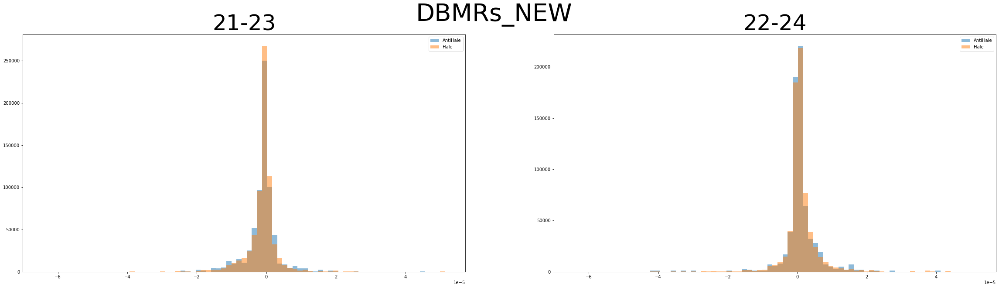

In [208]:
# BMRs

fig, axs = plt.subplots(ncols=2, figsize=(40,10))
fig.suptitle('DBMRs_NEW', fontsize=56)

bins_dbmr = np.linspace(allMag['DBMr'].min(), allMag['DBMr'].max(), 80)

#axs[0,0].hist(general_21n_23n.DBMr, density=True, bins=bins_dbmr, alpha=0.5, label='General')
axs[0].hist(np.concatenate([neighborhood_ah_21n_23n.DBMr, neighborhood_ah_21s_23s.DBMr]), density=True, bins=bins_dbmr, alpha=0.5, label='AntiHale')
axs[0].hist(np.concatenate([neighborhood_hh_21n_23n.DBMr, neighborhood_hh_21s_23s.DBMr]), density=True, bins=bins_dbmr, alpha=0.5, label='Hale')
axs[0].legend()
axs[0].set_title('21-23', fontsize=50)

axs[1].hist(np.concatenate([neighborhood_ah_22n_24n.DBMr, neighborhood_ah_22s_24s.DBMr]), density=True, bins=bins_dbmr, alpha=0.5, label='AntiHale')
axs[1].hist(np.concatenate([neighborhood_hh_22n_24n.DBMr, neighborhood_hh_22s_24s.DBMr]), density=True, bins=bins_dbmr, alpha=0.5, label='Hale')
axs[1].legend()
axs[1].set_title('22-24', fontsize=50)

print('21-23 AH: ', np.mean(np.concatenate([neighborhood_ah_21n_23n.DBMr, neighborhood_ah_21s_23s.DBMr])))
print('21-23 HH: ', np.mean(np.concatenate([neighborhood_hh_21n_23n.DBMr, neighborhood_hh_21s_23s.DBMr])))
print('22-24 AH: ', np.mean(np.concatenate([neighborhood_ah_22n_24n.DBMr, neighborhood_ah_22s_24s.DBMr])))
print('22-24 HH: ', np.mean(np.concatenate([neighborhood_hh_22n_24n.DBMr, neighborhood_hh_22s_24s.DBMr])))

In [209]:
allMag['BMRColatitude'] = (90 - allMag.BMRLatitude) * np.pi/180
allMag['PColatitude'] = (90 - allMag.PLatitude) * np.pi/180
allMag['NColatitude'] = (90 - allMag.NLatitude) * np.pi/180

R_sun = 6.96 * 10e8 * 10e2  # cm

Dbmr = - (3/(4*np.pi)) * allMag.BMRFlux * np.sin(allMag.BMRColatitude) * (allMag.PColatitude - allMag.NColatitude) / R_sun**2

In [210]:
R_sun = 6.96 * 10e8 * 10e2  # cm

Dbmr = - (3/(4*np.pi)) * allMag.BMRFlux * np.sin(allMag.BMRColatitude) * (allMag.PColatitude - allMag.NColatitude) / R_sun**2

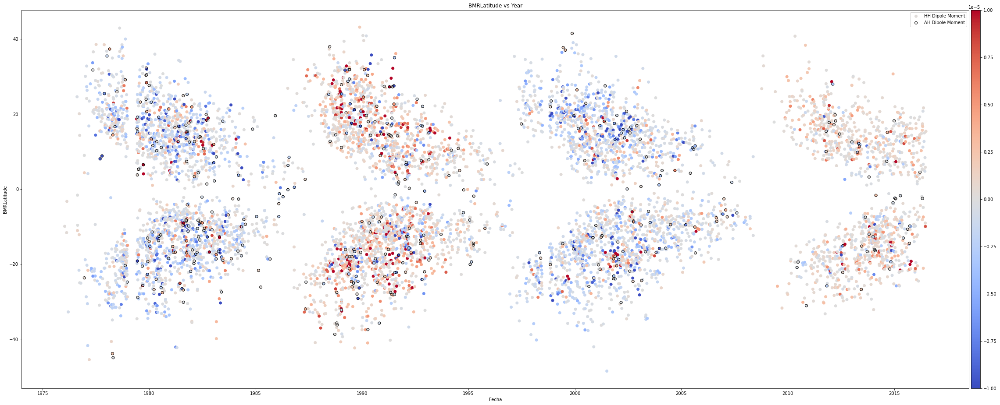

In [211]:
vlim = 1e-5

fig = plt.figure()
ax = fig.add_axes([0.1, 0.1, 5, 3])
c = ax.scatter(allMag.Date, allMag.BMRLatitude, label='HH Dipole Moment', c=Dbmr, cmap='coolwarm', vmax=vlim, vmin=-vlim)
ax.scatter(AH.Date, AH.BMRLatitude, label='AH Dipole Moment', c='None', cmap='coolwarm', vmax=vlim, vmin=-vlim, edgecolor='k')
colorbar_ax = fig.add_axes([5.11, 0.1, 0.05, 3])
fig.colorbar(c, cax=colorbar_ax)
ax.set_title('BMRLatitude vs Year')
ax.set_xlabel('Fecha')
ax.set_ylabel('BMRLatitude')
ax.legend()
plt.show()

In [212]:
len(allMag)

7543

In [213]:
allMag.AntiHale

0       False
1       False
2       False
3       False
4       False
        ...  
7538    False
7539    False
7540    False
7541    False
7542    False
Name: AntiHale, Length: 7543, dtype: bool

In [222]:
def background_and_AH(days_interval, latitude_division):    
    date_interval = pd.Timedelta(days_interval,'d')
    lat_division = latitude_division

    lat_plt = np.linspace(-50, 50, lat_division + 1)
    date_plt = np.arange(allMag.Date.min(), allMag.Date.max() + date_interval, date_interval)
    date_division = date_plt.shape[0] - 1

    background_matrix = np.zeros((lat_division, date_division))

    AH_matrix = np.zeros((lat_division, date_division))
    HH_matrix = np.zeros((lat_division, date_division))

    down_date = allMag.Date.min()

    for i in range(date_division):
        mask_date = np.logical_and(allMag.Date >= date_plt[i], allMag.Date <= date_plt[i+1])
        mask_date = allMag[mask_date]
        down_lat = allMag.BMRLatitude.min()
        for j in range(lat_division):
            mask_lat = np.logical_and(mask_date.BMRLatitude >= lat_plt[j], mask_date.BMRLatitude <= lat_plt[j+1])

            
            mask_lat = mask_date[mask_lat]


            DBMR_sum = np.sum(mask_lat.DBMr)


            #DBMR_sum = np.sum(mask_lat)

            background_matrix[j,i] = DBMR_sum

            AH_matrix[j,i] = np.sum(mask_lat.AntiHale)
            HH_matrix[j,i] = np.sum(np.logical_not(mask_lat.AntiHale))

    v_max = np.max(np.abs(background_matrix)) * .5

    fig = plt.figure(figsize=(10,10))

    ax = fig.add_axes([0.1, 0.1, 1, 1])
    ax.pcolormesh(date_plt, lat_plt, background_matrix, cmap='coolwarm', vmax=v_max, vmin=-v_max)
    ax.scatter(AH.Date, AH.BMRLatitude, label='AH Dipole Moment', s=1, color='k')
    ax.contour((date_plt[0:-1] + (date_plt[1] - date_plt[0])/2), (lat_plt[1:] + lat_plt[0:-1])/2, AH_matrix, levels=[2,3,4,5,6])
    #ax.scatter(HH.Date, HH.BMRLatitude, label='HH Dipole Moment', s=1, color='k')

    ax2 = fig.add_axes([1.1, 0.1, 1, 1])
    ax2.pcolormesh(date_plt, lat_plt, AH_matrix, cmap='magma_r', vmin=0)
    ax2.scatter(AH.Date, AH.BMRLatitude, label='AH Dipole Moment', s=1, color='k')

    return(background_matrix, AH_matrix, HH_matrix)

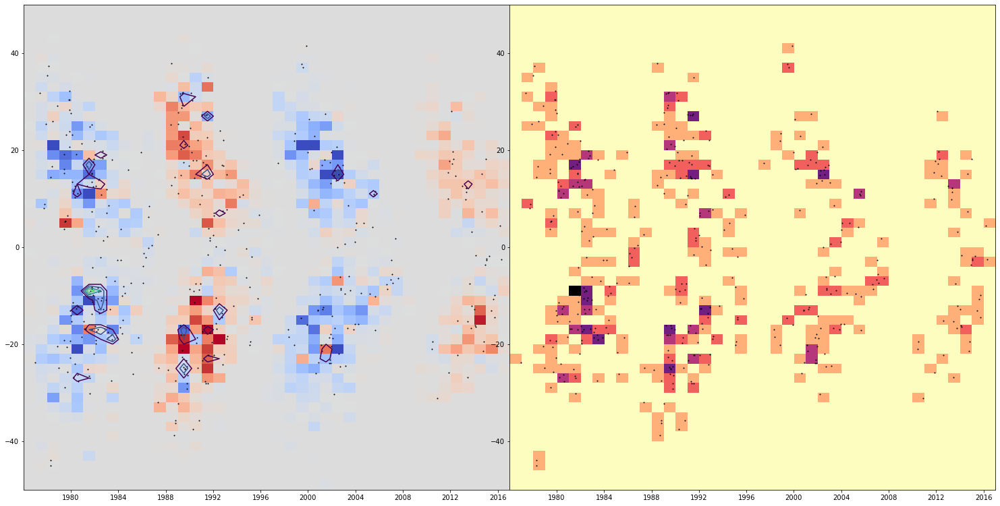

In [223]:
background_matrix, AH_matrix, HH_matrix = background_and_AH(365,50) # days_interval, lat_division

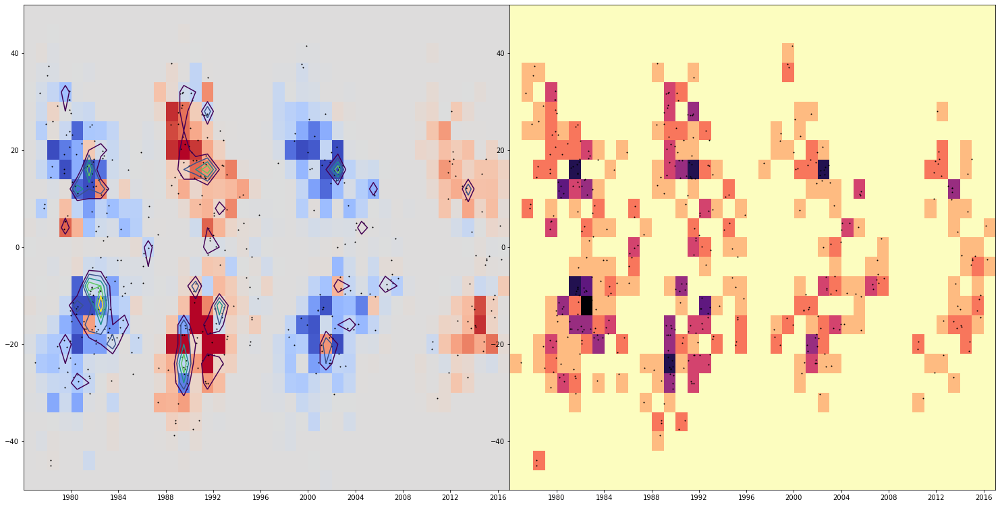

In [224]:
background_matrix, AH_matrix, HH_matrix = background_and_AH(365, 25)

(array([[629.,  56.,  17.,   0.,   7.,   2.,   0.,   0.,   0.,   0.],
        [ 62.,  29.,  14.,   0.,   5.,   4.,   0.,   0.,   1.,   0.],
        [ 28.,  15.,   6.,   0.,   5.,   3.,   0.,   1.,   1.,   0.],
        [ 11.,   8.,   5.,   0.,   1.,   3.,   0.,   1.,   1.,   0.],
        [  9.,   5.,   6.,   0.,   2.,   0.,   0.,   0.,   0.,   0.],
        [  5.,   3.,   2.,   0.,   4.,   0.,   0.,   1.,   0.,   0.],
        [  3.,   2.,   3.,   0.,   1.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   3.,   2.,   0.,   0.,   1.,   0.,   0.,   1.,   1.],
        [  0.,   1.,   2.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  2.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.]]),
 array([0.00000000e+00, 2.71473633e-05, 5.42947267e-05, 8.14420900e-05,
        1.08589453e-04, 1.35736817e-04, 1.62884180e-04, 1.90031543e-04,
        2.17178907e-04, 2.44326270e-04, 2.71473633e-04]),
 array([0. , 0.7, 1.4, 2.1, 2.8, 3.5, 4.2, 4.9, 5.6, 6.3, 7. ]),
 <matplotlib.collections.QuadMe

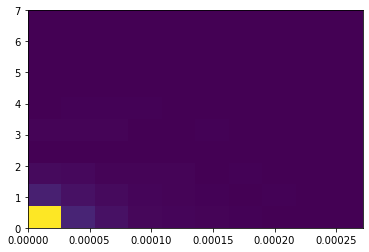

In [242]:
bins = 1

cumm_dipole = background_matrix[:, 2:] + background_matrix[:, 1:-1] + background_matrix[:, 0:-2]

plt.hist2d(np.abs(cumm_dipole.reshape(-1)), AH_matrix[:, 2:].reshape(-1), bins=10)

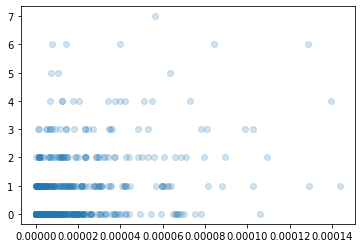

In [234]:
plt.scatter(np.abs(background_matrix[:]), AH_matrix[:], alpha=0.2)

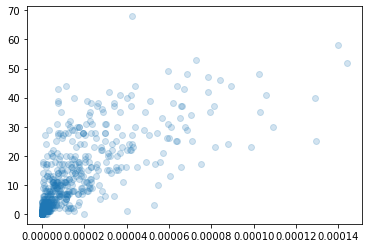

In [226]:
plt.scatter(np.abs(background_matrix[:]), HH_matrix[:], alpha=0.2)